In [40]:
import sys
sys.path.append("../Display")

from display import STMimagePlot,STMspecPlot,STMgridPlot
from os.path import join
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from IPython.display import HTML, display
import warnings
warnings.filterwarnings("ignore")

In [41]:
myDir,myFolder,myfileName="../../../STMdata","20221116","Grid Spectroscopy017.3ds"   
databaseName="../../STMdata.db"
filePath=join(myDir,myFolder,myfileName)
Mygrid=STMgridPlot(filePath=filePath,dataseName=databaseName)

In [3]:
Mygrid.display_meta_data()

,Name,Value
0,List_ID,5821
1,TIME_STAMP,1668853309.0
2,Grid_dim,"""128 x 128"""
3,Grid_settings,5.945114E-7;-5.126097E-7;1.000000E-8;1.000000E-8;0.000000E+0
4,Filetype,Linear
5,Sweep_Signal,"""Bias (V)"""
6,Fixed_parameters,"""Sweep Start;Sweep End"""
7,Experiment_parameters,"""X (m);Y (m);Z (m);Z offset (m);Settling time (s);Integration time (s);Z-Ctrl hold;Final Z (m);Scan:Current (A);Scan:Z (m);Scan:LIX 1 omega (A);Scan:LIY 1 omega (A)"""
8,Parameters,14
9,Experiment_size,6144


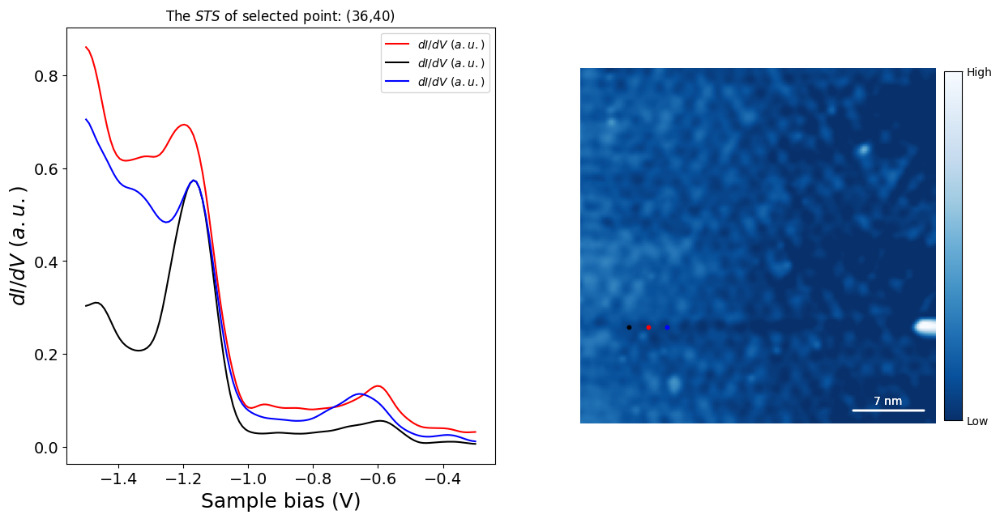

In [49]:
fig, ax= plt.subplots(1,2,figsize=(15,7))
point1,point2,point3=(28,40),(20,40),(36,40)
Mygrid.display_single_spec(fig,ax[0],point=point1,isnormolize=True,isgauss=True,sigma=3)
Mygrid.display_single_spec(fig,ax[0],point=point2,isnormolize=True,isgauss=True,sigma=3,color="k")
Mygrid.display_single_spec(fig,ax[0],point=point3,isnormolize=True,isgauss=True,sigma=3,color="b")
Mygrid.display_topo(fig,ax[1],imagetitle="",ispoint=True,point=point1,isgauss=True,sigma=1)
Mygrid.display_topo(fig,ax[1],imagetitle="",ispoint=True,point=point2,isgauss=False,sigma=1,iscolorbar=False,pointcolor="k",isnormolize=True,sig=0.9)
Mygrid.display_topo(fig,ax[1],imagetitle="",ispoint=True,point=point3,isgauss=True,sigma=1,iscolorbar=False,pointcolor="b",isnormolize=True,sig=0.9)

In [5]:
bias,grid=Mygrid.get_grid_value()

In [8]:
import numpy as np
from os.path import join
import matplotlib.pyplot as plt
import matplotlib as mpl
import nanonispy as nap
import pandas as pd
from IPython import display
from numpy.fft import ifftshift,fftshift,fft2,ifft2
from numpy import diff
from scipy.ndimage import gaussian_filter
import math
from math import pi
import itertools
from copy import copy
import time
import numpy.matlib
from matplotlib.colors import LogNorm
from scipy import interpolate,signal
import pySPM
from scipy.ndimage import gaussian_filter,generate_binary_structure,binary_erosion,maximum_filter
from scipy.signal import find_peaks,peak_widths,find_peaks_cwt
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable 
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
from matplotlib.font_manager import FontProperties
import time

In [15]:
def plot_STS_line_spectrum(sweep,raw,ax,offset=3e-13,color="C3",unit=1e11,lines=[],colorA=["r",'coral',"peachpuff","lightskyblue","royalblue","k",'coral',"grey","yellow"]):
    
    xlabel="Sample bias (V)"
    ylabel=r"$dI/dV$ ($a.u.$)"
    title=r"The waterfall of $STS$ along the cut line"
    step=(sweep[-1]-sweep[0])/raw.shape[1]
    for j,cole in enumerate(raw):
        raw_data = cole
        raw_filted=gaussian_filter(raw_data, sigma=3)
        peak, _ = find_peaks(raw_filted, distance=200)
        peak_bias = peak*step+sweep[0]
        ax.plot(sweep,(raw_filted+offset*j)*unit,color=color)
        if len(lines):
            for i,line in enumerate(lines):
                if j==line:
                    ax.plot(sweep,(raw_filted+offset*j)*unit,color=colorA[i])
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.xaxis.get_label().set_fontsize(18)
    ax.yaxis.get_label().set_fontsize(18)
    ax.tick_params(axis='y', labelsize=14)
    ax.tick_params(axis='x', labelsize=14)
    ax.set_title(title,fontsize=18)

def plot_peak_spectrum(sweep,raw,ax,offset=3e-13,color=["C3","k"],unit=1e11):
    data=[]
    peak_arr1=[]
    peak_arr2=[]
    peak_arrA1=[]
    peak_arrA2=[]
    step=(sweep[-1]-sweep[0])/(np.array(raw).shape)[1]
    for j,cole in enumerate( raw):
        wid=int(len(sweep)/2)
        raw_data = cole[:wid]
        sweepC1=sweep[:wid]
        raw_filted=gaussian_filter(raw_data, sigma=3)
        peak, _ = find_peaks(raw_filted[::-1], distance=300,height=[0.3e-11,0.9e-11],width=20)
        peak_bias = peak*step+sweepC1[0]
        ax.plot(peak_bias, (raw_filted[peak]+offset*j)*unit, "*",color=color[0])
        if len(peak_bias)>0:
            peak_arr1.append(peak_bias[0])
           
        raw_data = cole[wid:]
        sweepC2=sweep[wid:]
        raw_filted=gaussian_filter(raw_data, sigma=3)
        peak, _ = find_peaks(raw_filted[::-1], distance=200,height=[1e-12,4e-12])
        peak_bias = peak*step+sweepC2[0]
        ax.plot(peak_bias, (raw_filted[peak]+offset*j)*unit, "*",color=color[1])
        if len(peak_bias)>0:
            peak_arr2.append(peak_bias[0])
           

def detect_peak_info(sweep,raw,unit=1e11,distance=300,width=20,height=[1e-12,1e-11],rel_height=0.5,color="grey"):
    distances=[]
    peaks=[]
    half_widths=[]
    Ints=[]
    for j,cole in enumerate( raw):
        raw_data = cole
        step=(sweep[-1]-sweep[0])/len(sweep)
        raw_filted=gaussian_filter(raw_data, sigma=3)
        peak, _ = find_peaks(raw_filted, distance=distance)
        results_half=peak_widths(raw_filted,peak,rel_height=rel_height)
        peak_bias = peak*step+sweep[0]
        if len(peak_bias)>0:
            peaks.append(peak_bias[0])
            half_widths.append(results_half[0][0]*step)
            distances.append(j)
            Ints.append(raw_filted[peak[0]]*unit)
    return distances,peaks,half_widths,Ints

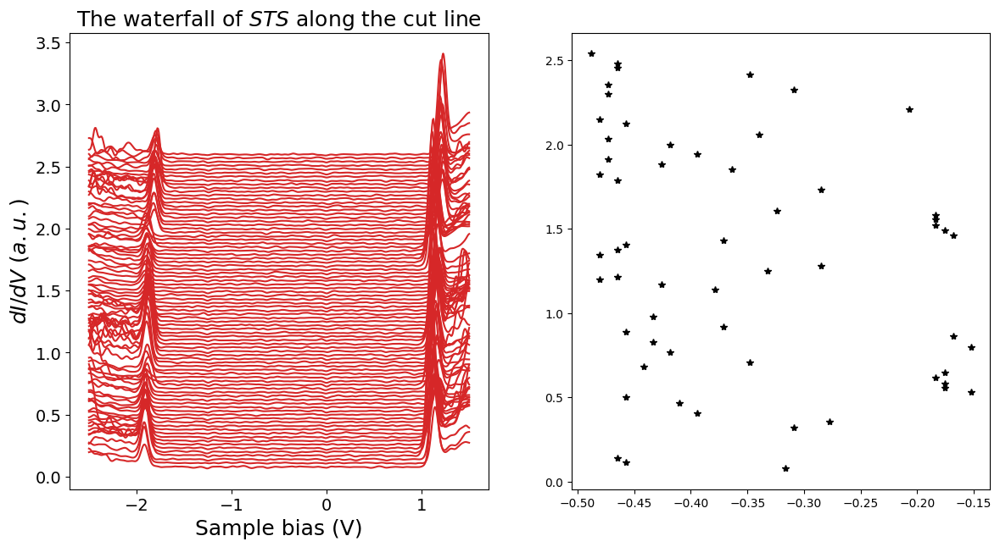

In [16]:
fig,ax=plt.subplots(1,2,figsize=(14,7))
plot_STS_line_spectrum(bias,grid[::,0,::],ax[0])
plot_peak_spectrum(bias,grid[::,0,::],ax[1])

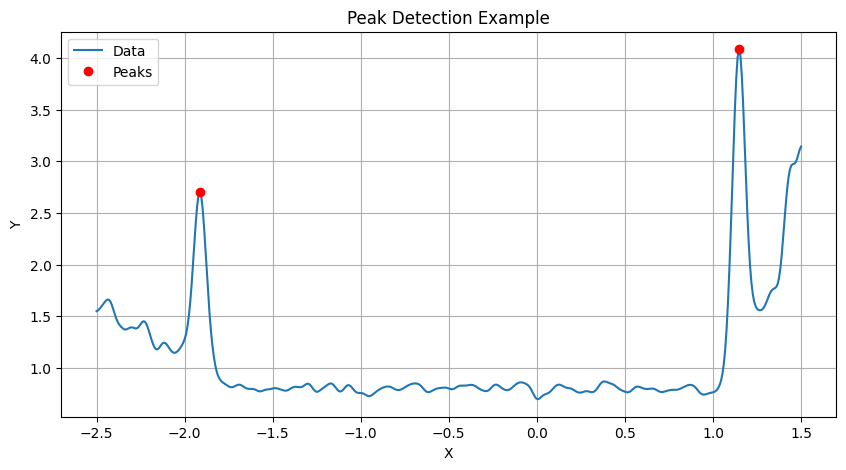

In [29]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Generate synthetic data with peaks
x = np.linspace(0, 10, 400)
y = (
    np.sin(x) +                  # First sinusoidal peak
    np.sin(3 * x) +              # Second sinusoidal peak
    0.5 * np.random.randn(len(x))  # Noise
)
i=10
y=gaussian_filter(grid[0+i:1+i,0,::][0]*1e12, sigma=3)
x=bias[::]

# Find peaks using scipy's find_peaks function
peaks, _ = find_peaks(y, height=1, distance=100)  # Adjust the parameters as needed

# Plot the data and detected peaks
plt.figure(figsize=(10, 5))
plt.plot(x, y, label='Data')
plt.plot(x[peaks], y[peaks], 'ro', label='Peaks')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Peak Detection Example')
plt.legend()
plt.grid()
plt.show()


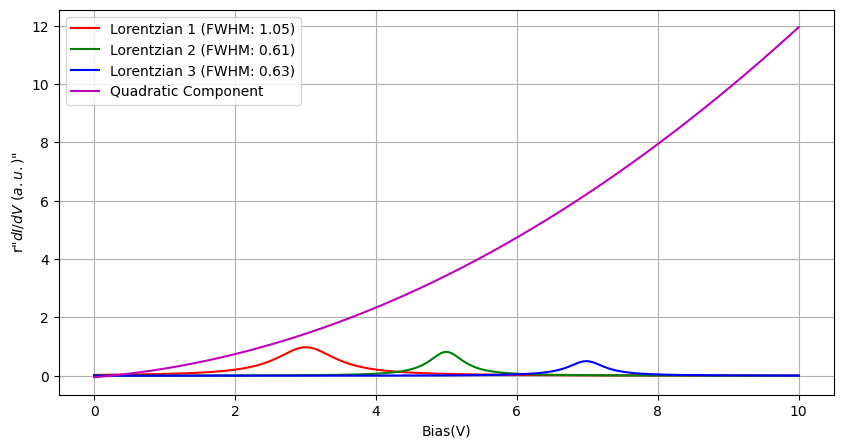

In [32]:
# Define the Lorentzian function
def lorentzian(x, amp, center, width, background):
    return background + amp * (width**2 / ((x - center)**2 + width**2))

# Calculate the FWHM of a Lorentzian peak
def lorentzian_fwhm(width):
    return 2 * width

# Define the overlapping function (Lorentzians + Quadratic)
def overlap_lorentz_quad(x, amp1, center1, width1, amp2, center2, width2, amp3, center3, width3, a, b, c):
    lorentz1 = lorentzian(x, amp1, center1, width1, 0)
    lorentz2 = lorentzian(x, amp2, center2, width2, 0)
    lorentz3 = lorentzian(x, amp3, center3, width3, 0)
    quad = a * x**2 + b * x + c
    return lorentz1 + lorentz2 + lorentz3 + quad

# Generate synthetic data
x_data = np.linspace(0, 10, 200)
y_data = overlap_lorentz_quad(x_data, 1, 3, 0.5, 0.8, 5, 0.3, 0.5, 7, 0.3, 0.1, 0.2, -0.05)
y_noise = np.random.normal(0, 0.05, len(x_data))
y_data += y_noise

# Fit the data using curve_fit
initial_guess = [1, 3, 0.5, 0.8, 5, 0.3, 0.5, 7, 0.3, 0.1, 0.2, -0.05]  # Initial parameter estimates
params, _ = curve_fit(overlap_lorentz_quad, x_data, y_data, p0=initial_guess)

# Extract the fitted parameters
amp1, center1, width1, amp2, center2, width2, amp3, center3, width3, a, b, c = params

# Calculate FWHMs
fwhm1 = lorentzian_fwhm(width1)
fwhm2 = lorentzian_fwhm(width2)
fwhm3 = lorentzian_fwhm(width3)

# Generate the individual components
lorentz1 = lorentzian(x_data, amp1, center1, width1, 0)
lorentz2 = lorentzian(x_data, amp2, center2, width2, 0)
lorentz3 = lorentzian(x_data, amp3, center3, width3, 0)
quad = a * x_data**2 + b * x_data + c

# Plot the individual Lorentzian peaks with FWHM and the quadratic component
plt.figure(figsize=(10, 5))
plt.plot(x_data, lorentz1, 'r', label=f'Lorentzian 1 (FWHM: {fwhm1:.2f})')
plt.plot(x_data, lorentz2, 'g', label=f'Lorentzian 2 (FWHM: {fwhm2:.2f})')
plt.plot(x_data, lorentz3, 'b', label=f'Lorentzian 3 (FWHM: {fwhm3:.2f})')
plt.plot(x_data, quad, 'm', label='Quadratic Component')
plt.xlabel('Bias(V)')
plt.ylabel('r"$dI/dV$ ($a.u.$)"')
plt.legend()
plt.grid()
plt.show()


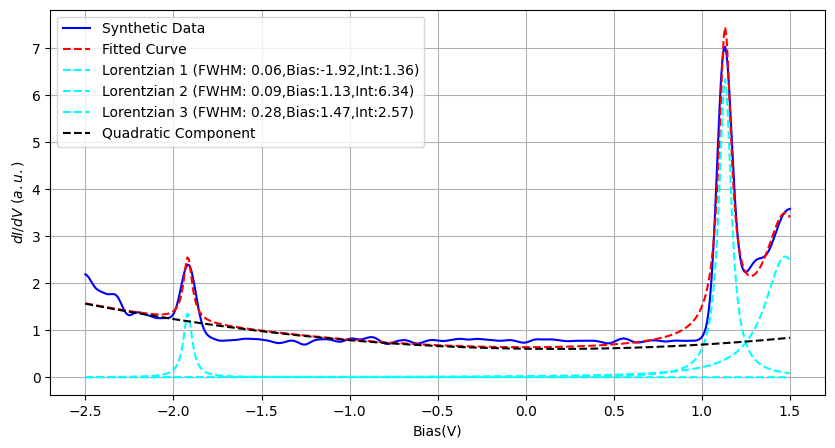

Amplitudes: 1.3623022634593676, 6.344815097296547, 2.569377398345141
Means: -1.9182006241706648, 1.1318625422123734, 1.4731490190336483
Standard Deviations: 0.030023601276698474, 0.042586978024416085, 0.14191278735951968
Quadratic Coefficients: 0.13454902300690563, -0.046615046640272675, 0.6068129829956098


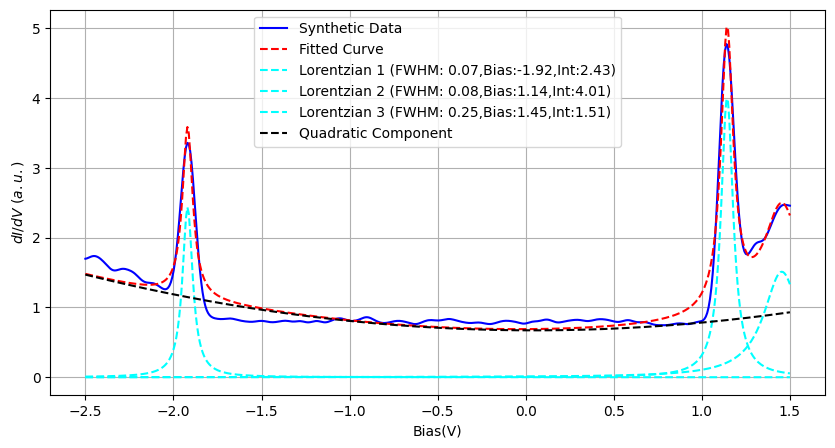

Amplitudes: 2.4348945639483524, 4.013143282736872, 1.51143684564097
Means: -1.9197623408415478, 1.1432852148400179, 1.4539509350317217
Standard Deviations: 0.03536710420430533, 0.04203926224385966, 0.12524594964154953
Quadratic Coefficients: 0.12287929164751349, -0.011937390246836467, 0.6719592193610833


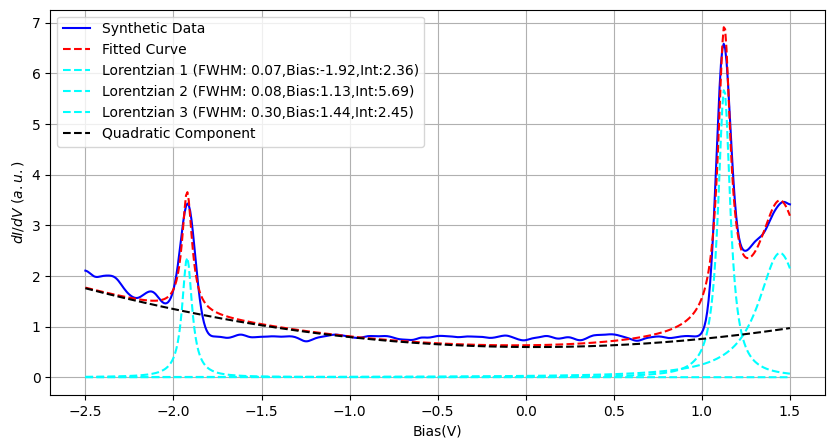

Amplitudes: 2.3627171500882684, 5.68653146814025, 2.4519749220362463
Means: -1.9223698421419146, 1.1269812640886752, 1.4434330103600148
Standard Deviations: 0.034092320197231914, 0.041830359987475633, 0.1498903369655307
Quadratic Coefficients: 0.1782438018273345, -0.01827312775673005, 0.5962386567176924


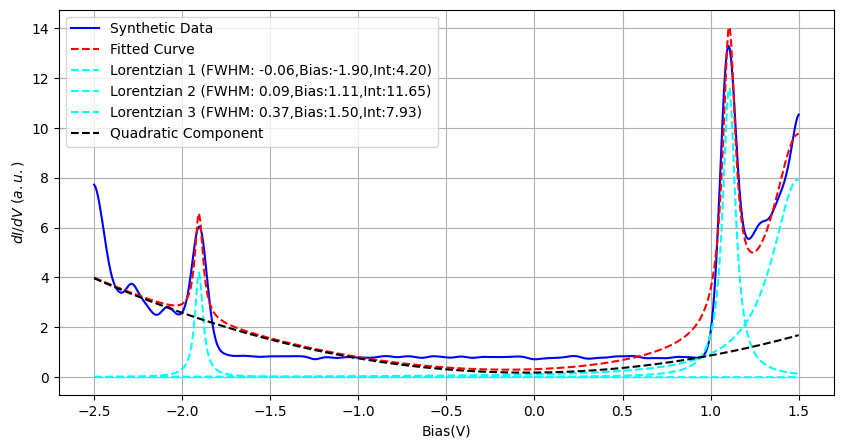

Amplitudes: 4.19525611947589, 11.647452187943854, 7.926574304880238
Means: -1.9049496968070312, 1.1050149449536493, 1.4966988846768374
Standard Deviations: -0.02791681283635678, 0.04376806005197094, 0.1825864718337327
Quadratic Coefficients: 0.6279926935991587, 0.05814611716017091, 0.186329001693732


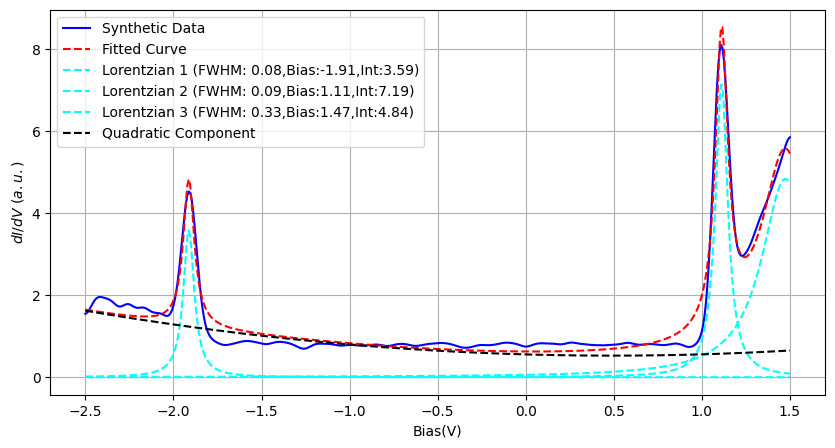

Amplitudes: 3.5850173829696526, 7.190567004833158, 4.8399437594511285
Means: -1.9127937609982084, 1.1120840409927952, 1.4737882134130322
Standard Deviations: 0.03784538774525154, 0.04286874167899549, 0.16488861046029765
Quadratic Coefficients: 0.12264911464071972, -0.120389526249685, 0.5566689304911703


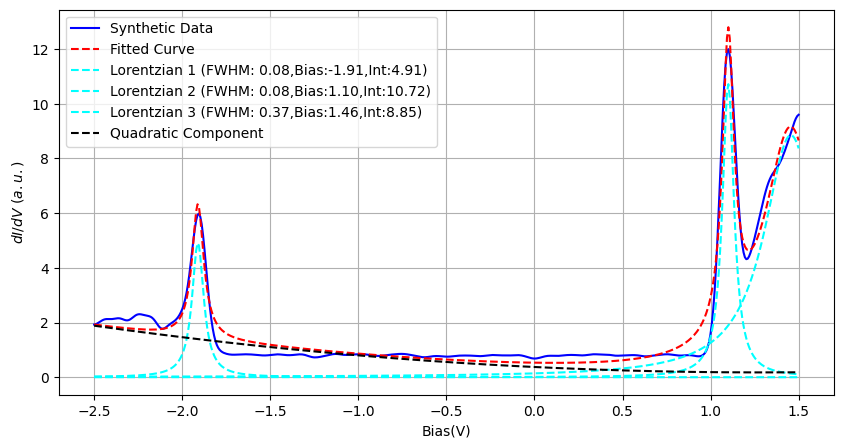

Amplitudes: 4.912729345344268, 10.71987698944013, 8.850784211474751
Means: -1.9107989569785686, 1.1000355013442245, 1.4554229997489692
Standard Deviations: 0.04043770968205632, 0.0401164494317001, 0.18542207074608275
Quadratic Coefficients: 0.11904598992395192, -0.306631067925806, 0.37424480995276044


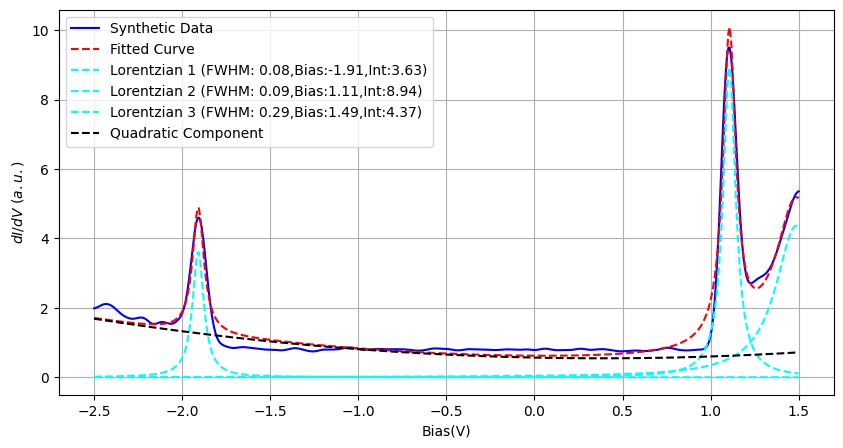

Amplitudes: 3.631627627132923, 8.941311244340419, 4.366717199533434
Means: -1.9088813153213369, 1.1067123208966243, 1.4865193414550824
Standard Deviations: 0.03878231283453929, 0.04357607105706739, 0.14280320216212486
Quadratic Coefficients: 0.13724484669354958, -0.1052458659870606, 0.5657960721998515


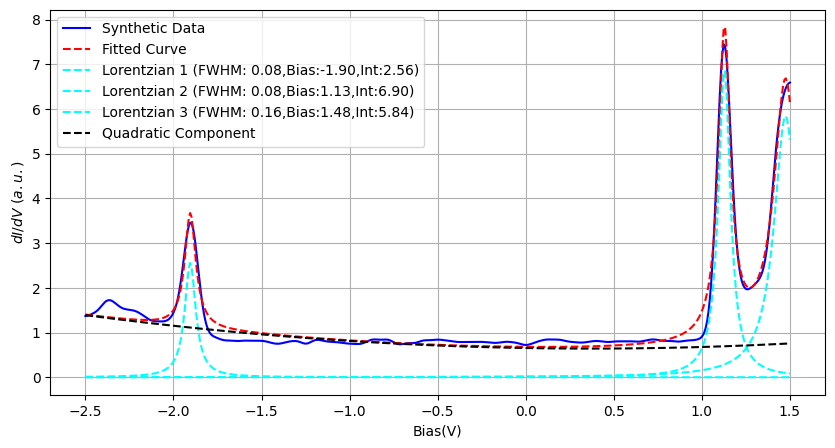

Amplitudes: 2.557620514070002, 6.9015525596435765, 5.839674618206258
Means: -1.9043679112869252, 1.1282553671617364, 1.4752068535861538
Standard Deviations: 0.03783735700369333, 0.04116762504977177, 0.07878181225733387
Quadratic Coefficients: 0.09073428895921724, -0.06756287812002511, 0.6531279562174428


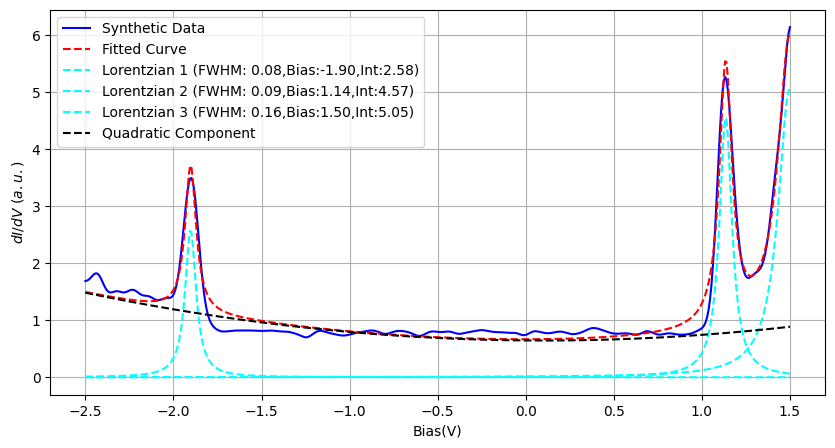

Amplitudes: 2.576503158928492, 4.56632575295556, 5.048219493455982
Means: -1.9026480778921728, 1.135399209090324, 1.4978087741703012
Standard Deviations: 0.03779949175223167, 0.043555431847085484, 0.07846714448205519
Quadratic Coefficients: 0.1236961227486154, -0.025479011630271785, 0.6448837579802922


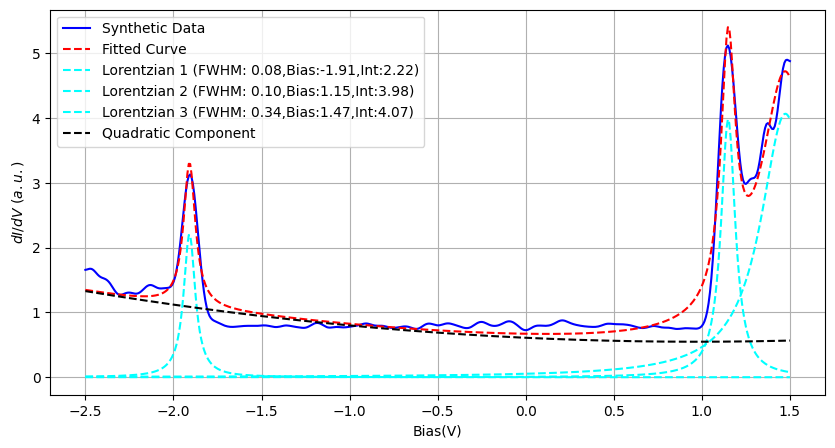

Amplitudes: 2.2156119141853723, 3.983959766455107, 4.067008389116602
Means: -1.909010659378601, 1.1494951265013864, 1.4742962974129117
Standard Deviations: 0.04008205481186142, 0.04957268247298715, 0.1706051436366146
Quadratic Coefficients: 0.06489600300054292, -0.12595947016147763, 0.6090615793348262


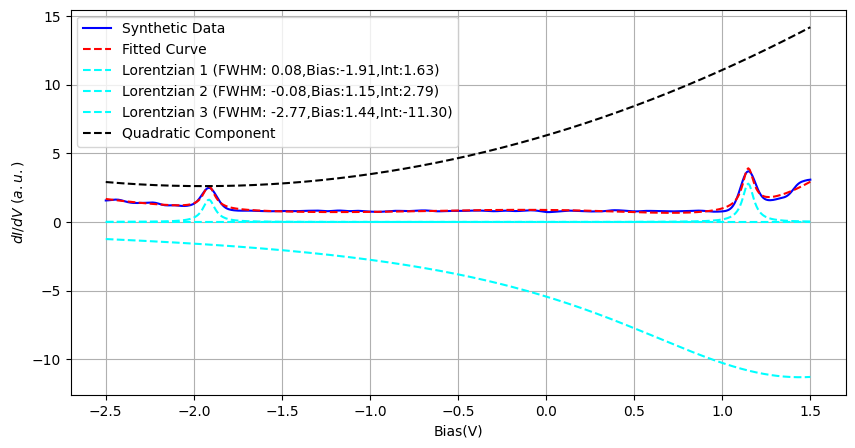

Amplitudes: 1.6267400114781825, 2.793990436627285, -11.303814568008876
Means: -1.9143868258401986, 1.147276910437167, 1.4410066691957308
Standard Deviations: 0.042434933634979806, -0.039206101230712886, -1.3849581539523528
Quadratic Coefficients: 0.9745815964164065, 3.792441088231251, 6.300940787818766


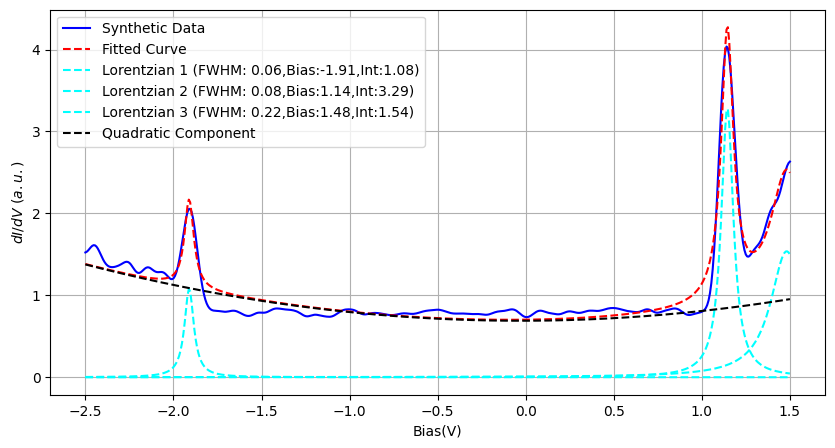

Amplitudes: 1.0814168968438351, 3.2918839948787966, 1.537869733513206
Means: -1.9108598523288687, 1.144580955495458, 1.4815006975035987
Standard Deviations: 0.03208887438736024, 0.042086052817480166, 0.11110822910631563
Quadratic Coefficients: 0.1127170727861756, 0.006819143801277018, 0.6894379733518053


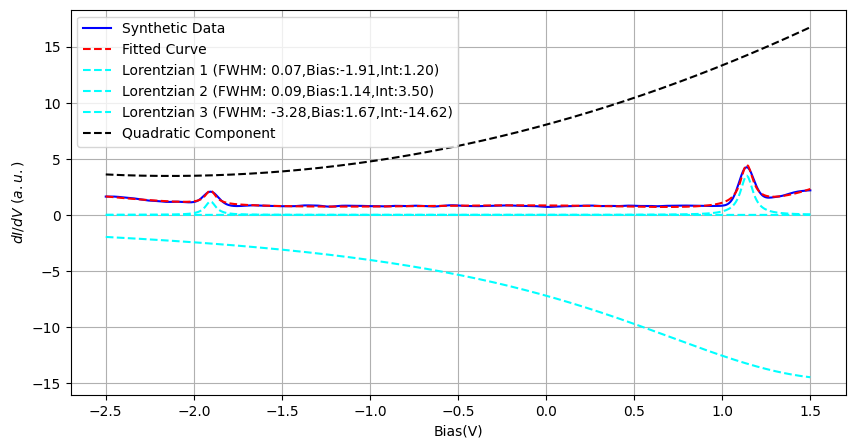

Amplitudes: 1.195480355380887, 3.4970201286303513, -14.62012241974275
Means: -1.9054299757545845, 1.1391473732239037, 1.6656578473875332
Standard Deviations: 0.0372233483850108, 0.04336918002332921, -1.6417169539934515
Quadratic Coefficients: 1.0042518891612404, 4.285684988107753, 8.043971656018417


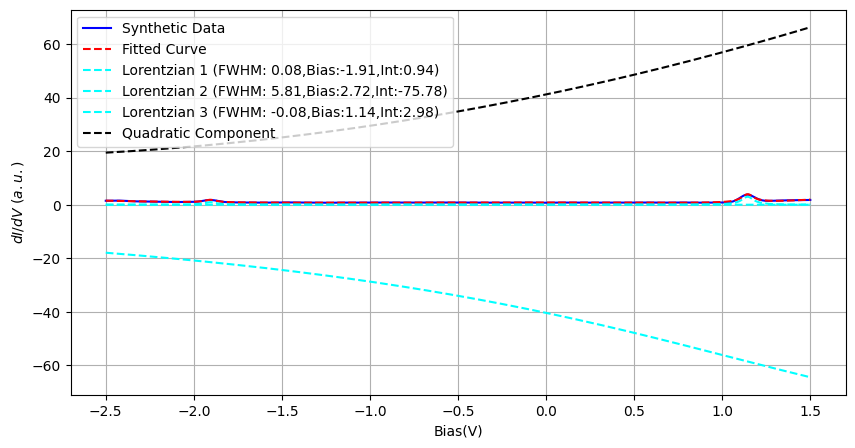

Amplitudes: 0.9407052962053271, -75.78401972255656, 2.9772354210205525
Means: -1.9057393778762306, 2.7189115800937027, 1.144264581829313
Standard Deviations: 0.041291488488946496, 2.9052367834895825, -0.04220378925179056
Quadratic Coefficients: 2.0090658367992114, 13.72442333762395, 41.20331160418682


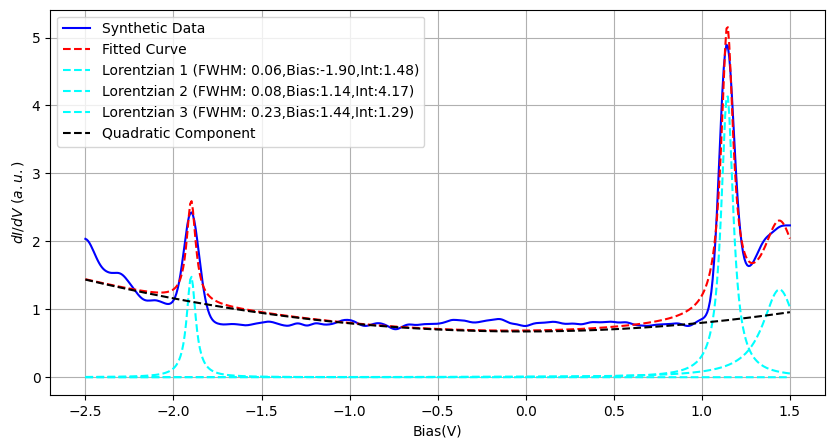

Amplitudes: 1.4844900082493628, 4.165775689040577, 1.291549339166033
Means: -1.89931573691861, 1.1440594598538485, 1.4407254012497248
Standard Deviations: 0.031213938506723448, 0.0413243118474809, 0.11721878367958335
Quadratic Coefficients: 0.12372207779774141, 0.0038200942532437, 0.673593054263239


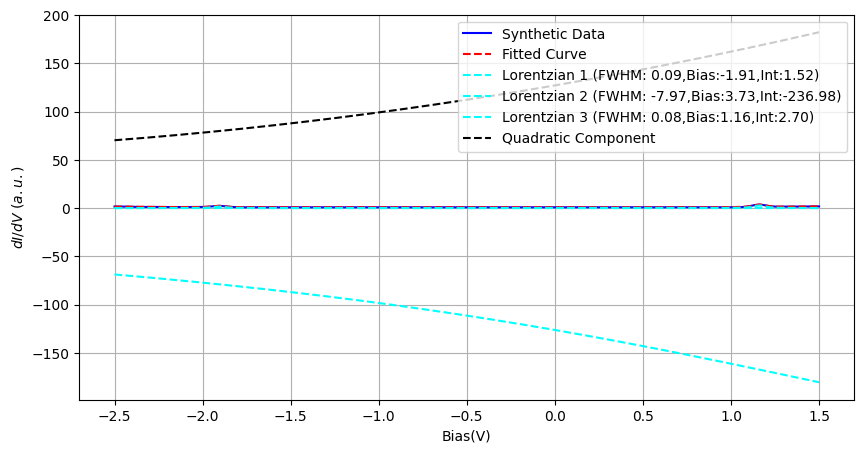

Amplitudes: 1.5167102542944948, -236.98158079542426, 2.6962354950433536
Means: -1.9077351386622896, 3.726541915506665, 1.1603858185261386
Standard Deviations: 0.04250779167238241, -3.9837891124232616, 0.04221119122337317
Quadratic Coefficients: 3.5066417448277702, 31.508779475687152, 127.19277880102358


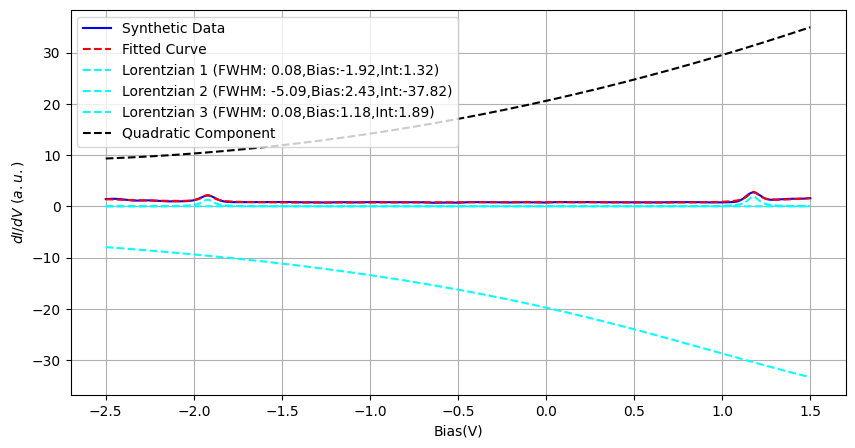

Amplitudes: 1.3220190845354143, -37.82367341541313, 1.888946371499562
Means: -1.9210819546337212, 2.4342454021938646, 1.1772214578376126
Standard Deviations: 0.04061900403476304, -2.546395028302177, 0.03979174409493503
Quadratic Coefficients: 1.2699382618742614, 7.672200205676616, 20.568670936073193


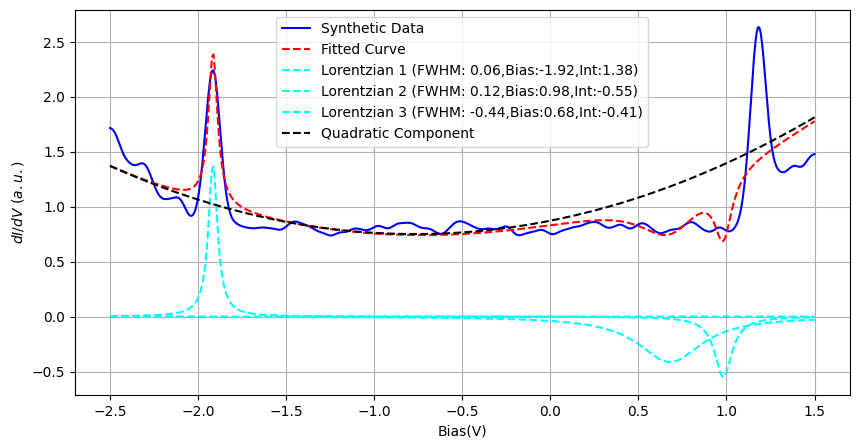

Amplitudes: 1.3756710944229238, -0.5519255233433444, -0.41419693604476293
Means: -1.9154227223946652, 0.9819734210467268, 0.6794707327732026
Standard Deviations: 0.031689724605195375, 0.0598555853075484, -0.22186097428029078
Quadratic Coefficients: 0.20648440863299836, 0.31696992631597193, 0.8722938623456299


In [26]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Define the overlapping function (Gaussians + Quadratic)
def overlap_gauss_quad(x, amp1, mean1, std_dev1, amp2, mean2, std_dev2, amp3, mean3, std_dev3, a, b, c):
    gauss1 = amp1 * np.exp(-((x - mean1) / std_dev1)**2)
    gauss2 = amp2 * np.exp(-((x - mean2) / std_dev2)**2)
    gauss3 = amp3 * np.exp(-((x - mean3) / std_dev3)**2)
    quad = a * x**2 + b * x + c
    return gauss1 + gauss2 + gauss3 + quad
def overlap_lorentz_quad(x, amp1, center1, width1, amp2, center2, width2, amp3, center3, width3, a, b, c):
    lorentz1 = amp1 * (width1**2 / ((x - center1)**2 + width1**2))
    lorentz2 = amp2 * (width2**2 / ((x - center2)**2 + width2**2))
    lorentz3 = amp3 * (width3**2 / ((x - center3)**2 + width3**2))
    quad = a * x**2 + b * x + c
    return lorentz1 + lorentz2 + lorentz3 + quad
def lorentzian_fwhm(width):
    return 2 * width

fwhmA,biasA,IntA=[],[],[]
for i in range(18):#(grid.shape[0]-1):
    # Generate synthetic data
    x_data = np.linspace(0, 10, 200)
    y_data = overlap_gauss_quad(x_data, 3, -1.8, 0.5, 5, 1.2, 0, 0.5, 1.8, 0.3, 0.01, 0.02, -0.05)
    y_noise = np.random.normal(0, 0.05, len(x_data))
    y_data += y_noise
    y_data=gaussian_filter(grid[i:i+1,0,::][0]*1e12, sigma=4)
    x_data=bias[::]

    # Fit the data using curve_fit
    initial_guess = [3, -1.9, 0.05, 5, 1.1, 0.01, 5, 1.5, 0.3, 0.01, 0.02, -0.05]  # Initial parameter estimates
    params, _ = curve_fit(overlap_lorentz_quad, x_data, y_data, p0=initial_guess)

    amp1, center1, width1, amp2, center2, width2, amp3, center3, width3, a, b, c = params
    fwhm1 = lorentzian_fwhm(width1)
    fwhm2 = lorentzian_fwhm(width2)
    fwhm3 = lorentzian_fwhm(width3)

    # Generate the individual components
    lorentz1 = lorentzian(x_data, amp1, center1, width1, 0)
    lorentz2 = lorentzian(x_data, amp2, center2, width2, 0)
    lorentz3 = lorentzian(x_data, amp3, center3, width3, 0)
    quad = a * x_data**2 + b * x_data + c
    fwhmA.append((fwhm1,fwhm2,fwhm3))
    biasA.append(((center1,center2,center3)))
    IntA.append((amp1,amp2,amp3))

    # Plot the original data and the fitted curve
    plt.figure(figsize=(10, 5))
    plt.plot(x_data, y_data, 'b', label='Synthetic Data')
    plt.plot(x_data, overlap_lorentz_quad(x_data, *params), 'r', linestyle='--',label='Fitted Curve')
    plt.plot(x_data, lorentz1, 'r', label=f'Lorentzian 1 (FWHM: {fwhm1:.2f},Bias:{center1:.2f},Int:{amp1:.2f})',linestyle='--',color="cyan")
    plt.plot(x_data, lorentz2, 'g', label=f'Lorentzian 2 (FWHM: {fwhm2:.2f},Bias:{center2:.2f},Int:{amp2:.2f})',linestyle='--',color="cyan")
    plt.plot(x_data, lorentz3, 'b', label=f'Lorentzian 3 (FWHM: {fwhm3:.2f},Bias:{center3:.2f},Int:{amp3:.2f})',linestyle='--',color="cyan")
    plt.plot(x_data, quad, 'm', label='Quadratic Component',linestyle='--',color="k")
    plt.xlabel('Bias(V)')
    plt.ylabel(r"$dI/dV$ ($a.u.$)")
    plt.legend()
    plt.grid()
    plt.show()

    # Extract the fitted parameters
    amp1, mean1, std_dev1, amp2, mean2, std_dev2, amp3, mean3, std_dev3, a, b, c = params
    print(f"Amplitudes: {amp1}, {amp2}, {amp3}")
    print(f"Means: {mean1}, {mean2}, {mean3}")
    print(f"Standard Deviations: {std_dev1}, {std_dev2}, {std_dev3}")
    print(f"Quadratic Coefficients: {a}, {b}, {c}")


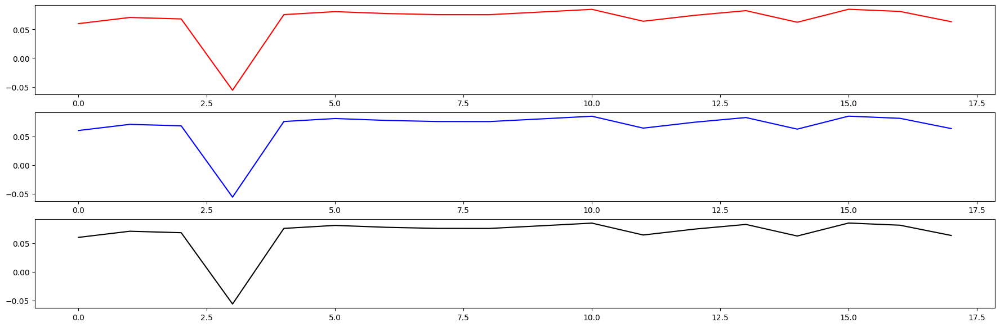

In [27]:
fig,ax= plt.subplots(3,1,figsize=(22,7))
fwh1,fwh2,fwh3 =[fwh1 for (fwh1,fwh2,fwh3) in fwhmA] ,[fwh2 for (fwh1,fwh2,fwh3) in fwhmA] ,[fwh3 for (fwh1,fwh2,fwh3) in fwhmA] 
ax[0].plot(fwh1,"r")
ax[1].plot(fwh1,"b")
ax[2].plot(fwh1,"k")

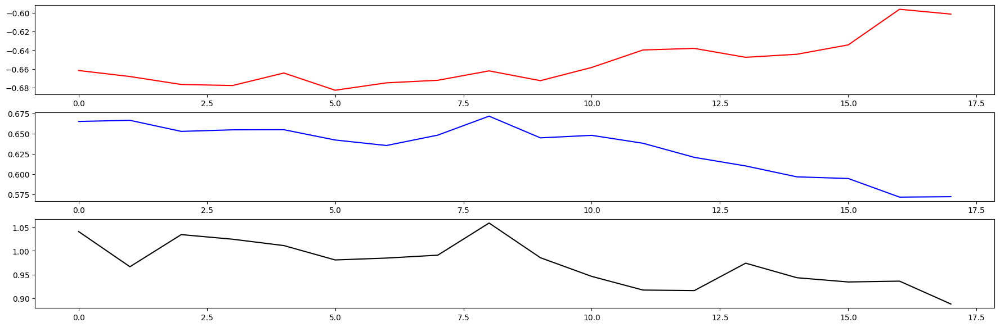

In [867]:
fig,ax= plt.subplots(3,1,figsize=(22,7))
biasA1,biasA2,biasA3 =[biasA1 for (biasA1,biasA2,biasA3) in biasA] ,[biasA2 for (biasA1,biasA2,biasA3) in biasA]  ,[biasA3 for (biasA1,biasA2,biasA3) in biasA] 
ax[0].plot(biasA1,"r")
ax[1].plot(biasA2,"b")
ax[2].plot(biasA3,"k")

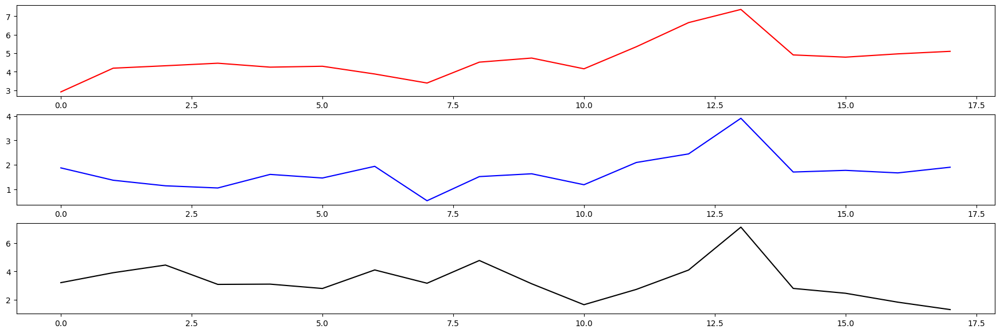

In [868]:
fig,ax= plt.subplots(3,1,figsize=(22,7))
IntA1,IntA2,IntA3 =[IntA1 for (IntA1,IntA2,IntA3) in IntA] ,[IntA2 for (IntA1,IntA2,IntA3) in IntA]  ,[IntA3 for (IntA1,IntA2,IntA3) in IntA]
ax[0].plot(IntA1,"r")
ax[1].plot(IntA2,"b")
ax[2].plot(IntA3,"k")

In [33]:
fwhmA,biasA,IntA=[],[],[]

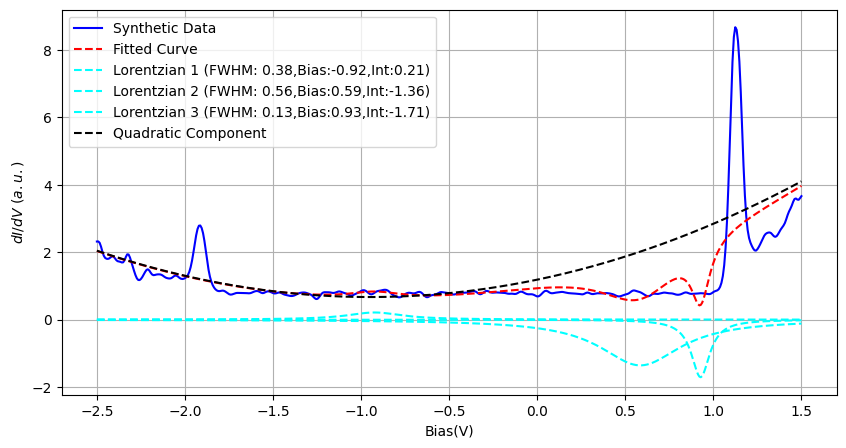

Amplitudes: 0.2122222970355185, -1.3578247141733257, -1.7098197362510925
Means: -0.9231575023176086, 0.585148737959561, 0.9273786216005749
Standard Deviations: 0.19138417104660949, 0.2809591320191782, 0.06352229371433189
Quadratic Coefficients: 0.5721520333022305, 1.086472030860003, 1.1860730501052559


In [35]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Define the overlapping function (Gaussians + Quadratic)
def overlap_gauss_quad(x, amp1, mean1, std_dev1, amp2, mean2, std_dev2, amp3, mean3, std_dev3, a, b, c):
    gauss1 = amp1 * np.exp(-((x - mean1) / std_dev1)**2)
    gauss2 = amp2 * np.exp(-((x - mean2) / std_dev2)**2)
    gauss3 = amp3 * np.exp(-((x - mean3) / std_dev3)**2)
    quad = a * x**2 + b * x + c
    return gauss1 + gauss2 + gauss3 + quad
def overlap_lorentz_quad(x, amp1, center1, width1, amp2, center2, width2, amp3, center3, width3, a, b, c):
    lorentz1 = amp1 * (width1**2 / ((x - center1)**2 + width1**2))
    lorentz2 = amp2 * (width2**2 / ((x - center2)**2 + width2**2))
    lorentz3 = amp3 * (width3**2 / ((x - center3)**2 + width3**2))
    quad = a * x**2 + b * x + c
    return lorentz1 + lorentz2 + lorentz3 + quad
def lorentzian_fwhm(width):
    return 2 * width


i=0

# Generate synthetic data
x_data = np.linspace(0, 10, 200)
y_data = overlap_gauss_quad(x_data, 4, -0.7, 0.6, 2, 0.62, 0.3, 0.5, 1, 0.3, 0.01, 0.02, -0.05)
y_noise = np.random.normal(0, 0.05, len(x_data))
y_data += y_noise
y_data=gaussian_filter(grid[i:i+1,0,::][0]*1e12, sigma=2)
x_data=bias[::]

# Fit the data using curve_fit
initial_guess = [4, -0.65, 0.05, 2, 0.62, 0.05, 5, 0.9, 0.08, 0.01, 0.02, -0.05]  # Initial parameter estimates
params, _ = curve_fit(overlap_lorentz_quad, x_data, y_data, p0=initial_guess)

amp1, center1, width1, amp2, center2, width2, amp3, center3, width3, a, b, c = params
fwhm1 = lorentzian_fwhm(width1)
fwhm2 = lorentzian_fwhm(width2)
fwhm3 = lorentzian_fwhm(width3)

# Generate the individual components
lorentz1 = lorentzian(x_data, amp1, center1, width1, 0)
lorentz2 = lorentzian(x_data, amp2, center2, width2, 0)
lorentz3 = lorentzian(x_data, amp3, center3, width3, 0)
quad = a * x_data**2 + b * x_data + c

# Plot the original data and the fitted curve
plt.figure(figsize=(10, 5))
plt.plot(x_data, y_data, 'b', label='Synthetic Data')
plt.plot(x_data, overlap_lorentz_quad(x_data, *params), 'r', linestyle='--',label='Fitted Curve')
plt.plot(x_data, lorentz1, 'r', label=f'Lorentzian 1 (FWHM: {fwhm1:.2f},Bias:{center1:.2f},Int:{amp1:.2f})',linestyle='--',color="cyan")
plt.plot(x_data, lorentz2, 'g', label=f'Lorentzian 2 (FWHM: {fwhm2:.2f},Bias:{center2:.2f},Int:{amp2:.2f})',linestyle='--',color="cyan")
plt.plot(x_data, lorentz3, 'b', label=f'Lorentzian 3 (FWHM: {fwhm3:.2f},Bias:{center3:.2f},Int:{amp3:.2f})',linestyle='--',color="cyan")
plt.plot(x_data, quad, 'm', label='Quadratic Component',linestyle='--',color="k")
plt.xlabel('Bias(V)')
plt.ylabel(r"$dI/dV$ ($a.u.$)")
plt.legend()
plt.grid()
plt.show()

# Extract the fitted parameters
amp1, mean1, std_dev1, amp2, mean2, std_dev2, amp3, mean3, std_dev3, a, b, c = params
print(f"Amplitudes: {amp1}, {amp2}, {amp3}")
print(f"Means: {mean1}, {mean2}, {mean3}")
print(f"Standard Deviations: {std_dev1}, {std_dev2}, {std_dev3}")
print(f"Quadratic Coefficients: {a}, {b}, {c}")


In [1139]:
fwhmA.append((fwhm1,fwhm2,fwhm3))
biasA.append(((center1,center2,center3)))
IntA.append((amp1,amp2,amp3))


In [1134]:
fwhmA=fwhmA[0:-1]
biasA=biasA[0:-1]
IntA=IntA[0:-1]

Text(0, 0.5, 'FWH(V)')

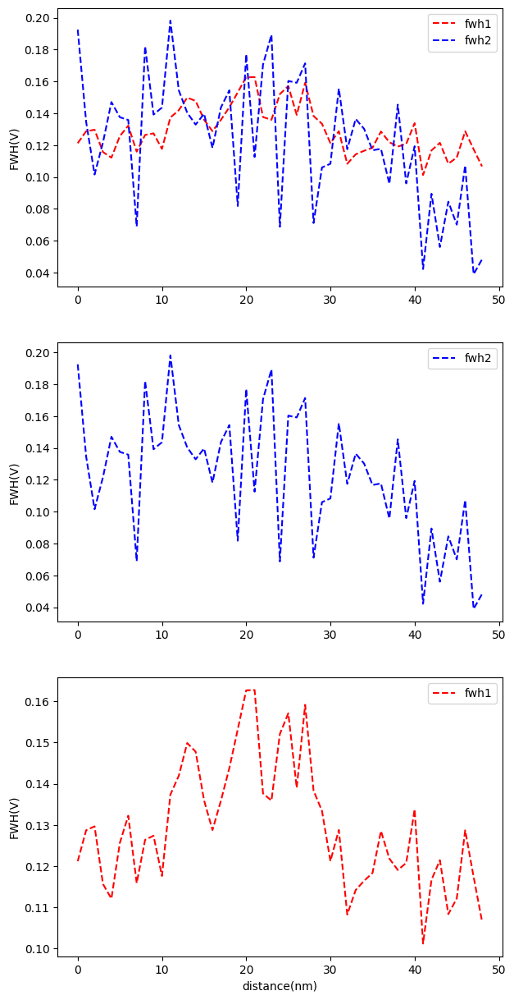

In [1156]:

fig,ax= plt.subplots(3,1,figsize=(7,15))
x_data = np.linspace(0, 20, 49)
fwh1,fwh2,fwh3 =[fwh1 for (fwh1,fwh2,fwh3) in fwhmA] ,[fwh2 for (fwh1,fwh2,fwh3) in fwhmA] ,[fwh3 for (fwh1,fwh2,fwh3) in fwhmA] 
ax[0].plot(abs(np.array(fwh1)),"r",label=f'fwh1',linestyle='--')
ax[0].plot(abs(np.array(fwh2)),"b",label=f'fwh2',linestyle='--')
ax[1].plot(abs(np.array(fwh2)),"b",label=f'fwh2',linestyle='--')
ax[2].plot(abs(np.array(fwh1)),"r",label=f'fwh1',linestyle='--')
ax[0].legend()
ax[1].legend()
ax[2].legend()
ax[2].set_xlabel("count")
ax[2].set_ylabel("FWH(V)")
ax[1].set_ylabel("FWH(V)")
ax[0].set_ylabel("FWH(V)")
plt.xlabel("distance(nm)") 
plt.ylabel("FWH(V)") 


In [ ]:
fwhmA=fwhmA[0:-2]

Text(0, 0.5, 'Bias(V)')

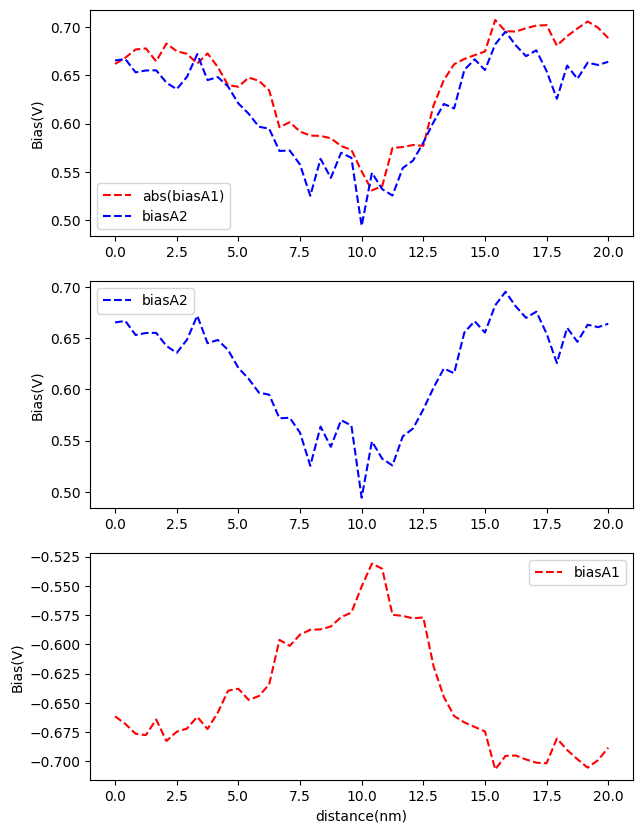

In [1155]:

fig,ax= plt.subplots(3,1,figsize=(7,15))
biasA1,biasA2,biasA3 =[biasA1 for (biasA1,biasA2,biasA3) in biasA] ,[biasA2 for (biasA1,biasA2,biasA3) in biasA]  ,[biasA3 for (biasA1,biasA2,biasA3) in biasA] 
x_data = np.linspace(0, 20, 49)
ax[0].plot(x_data,abs(np.array(biasA1)),"r",label=f'abs(biasA1)',linestyle='--')
ax[0].plot(x_data,abs(np.array(biasA2)),"b",label=f'biasA2',linestyle='--')
ax[1].plot(x_data,np.array(biasA2),"b",label=f'biasA2',linestyle='--')
ax[2].plot(x_data,np.array(biasA1),"r",label=f'biasA1',linestyle='--')
ax[0].legend()
ax[1].legend()
ax[2].legend()
ax[2].set_xlabel("count")
ax[2].set_ylabel("Bias(V)")
ax[1].set_ylabel("Bias(V)")
ax[0].set_ylabel("Bias(V)")
plt.xlabel("distance(nm)") 
plt.ylabel("Bias(V)") 

In [1]:
print(fwhmA,biasA,IntA)

NameError: name 'fwhmA' is not defined

In [771]:
print(fwhmA[1][1])

0.13460854988654364


In [ ]:
ax[0].plot()

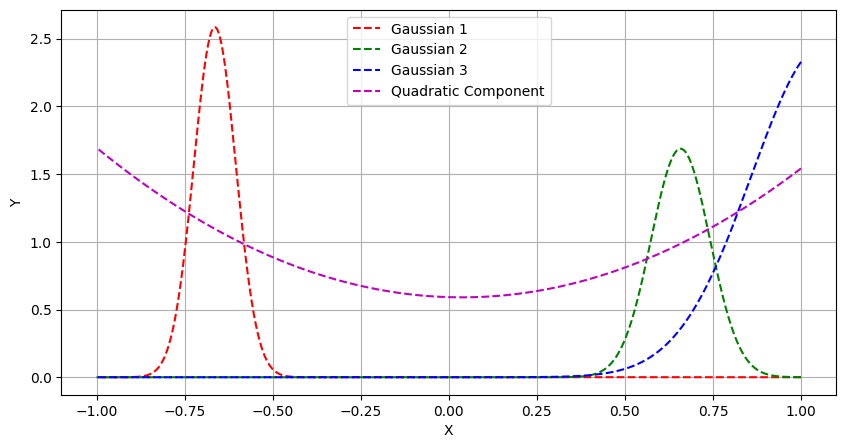

In [715]:
amp1, mean1, std_dev1, amp2, mean2, std_dev2, amp3, mean3, std_dev3, a, b, c = params

# Generate the individual components
gauss1 = amp1 * np.exp(-((x_data - mean1) / std_dev1)**2)
gauss2 = amp2 * np.exp(-((x_data - mean2) / std_dev2)**2)
gauss3 = amp3 * np.exp(-((x_data - mean3) / std_dev3)**2)
quad = a * x_data**2 + b * x_data + c

# Plot the individual Gaussian peaks and the quadratic component
plt.figure(figsize=(10, 5))
plt.plot(x_data, gauss1, 'r', label='Gaussian 1',linestyle='--')
plt.plot(x_data, gauss2, 'g', label='Gaussian 2',linestyle='--')
plt.plot(x_data, gauss3, 'b', label='Gaussian 3',linestyle='--')
plt.plot(x_data, quad, 'm', label='Quadratic Component',linestyle='--')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend()
plt.grid()
plt.show()

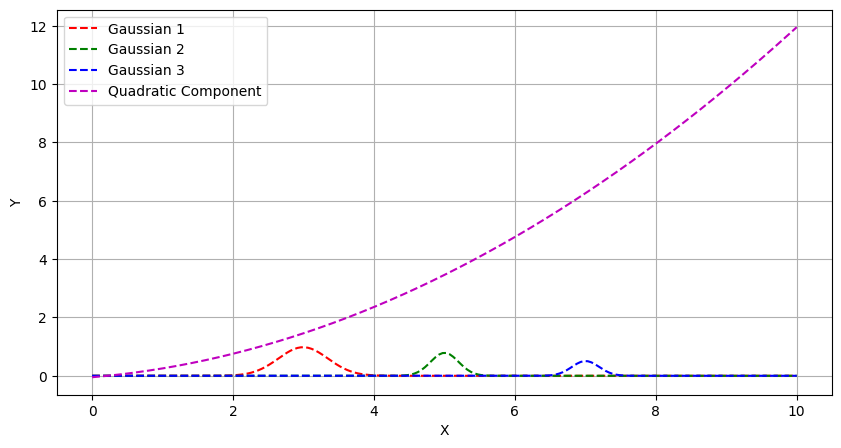

In [712]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Define the overlapping function (Gaussians + Quadratic)
def overlap_gauss_quad(x, amp1, mean1, std_dev1, amp2, mean2, std_dev2, amp3, mean3, std_dev3, a, b, c):
    gauss1 = amp1 * np.exp(-((x - mean1) / std_dev1)**2)
    gauss2 = amp2 * np.exp(-((x - mean2) / std_dev2)**2)
    gauss3 = amp3 * np.exp(-((x - mean3) / std_dev3)**2)
    quad = a * x**2 + b * x + c
    return gauss1 + gauss2 + gauss3 + quad

# Generate synthetic data
x_data = np.linspace(0, 10, 200)
y_data = overlap_gauss_quad(x_data, 1, 3, 0.5, 0.8, 5, 0.3, 0.5, 7, 0.3, 0.1, 0.2, -0.05)
y_noise = np.random.normal(0, 0.05, len(x_data))
y_data += y_noise

# Fit the data using curve_fit
initial_guess = [1, 3, 0.5, 0.8, 5, 0.3, 0.5, 7, 0.3, 0.1, 0.2, -0.05]  # Initial parameter estimates
params, _ = curve_fit(overlap_gauss_quad, x_data, y_data, p0=initial_guess)

# Extract the fitted parameters
amp1, mean1, std_dev1, amp2, mean2, std_dev2, amp3, mean3, std_dev3, a, b, c = params

# Generate the individual components
gauss1 = amp1 * np.exp(-((x_data - mean1) / std_dev1)**2)
gauss2 = amp2 * np.exp(-((x_data - mean2) / std_dev2)**2)
gauss3 = amp3 * np.exp(-((x_data - mean3) / std_dev3)**2)
quad = a * x_data**2 + b * x_data + c

# Plot the individual Gaussian peaks and the quadratic component
plt.figure(figsize=(10, 5))
plt.plot(x_data, gauss1, 'r', label='Gaussian 1',linestyle='--')
plt.plot(x_data, gauss2, 'g', label='Gaussian 2',linestyle='--')
plt.plot(x_data, gauss3, 'b', label='Gaussian 3',linestyle='--')
plt.plot(x_data, quad, 'm', label='Quadratic Component',linestyle='--')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend()
plt.grid()
plt.show()


[ 44 163 845]
Erro
Erro
Erro


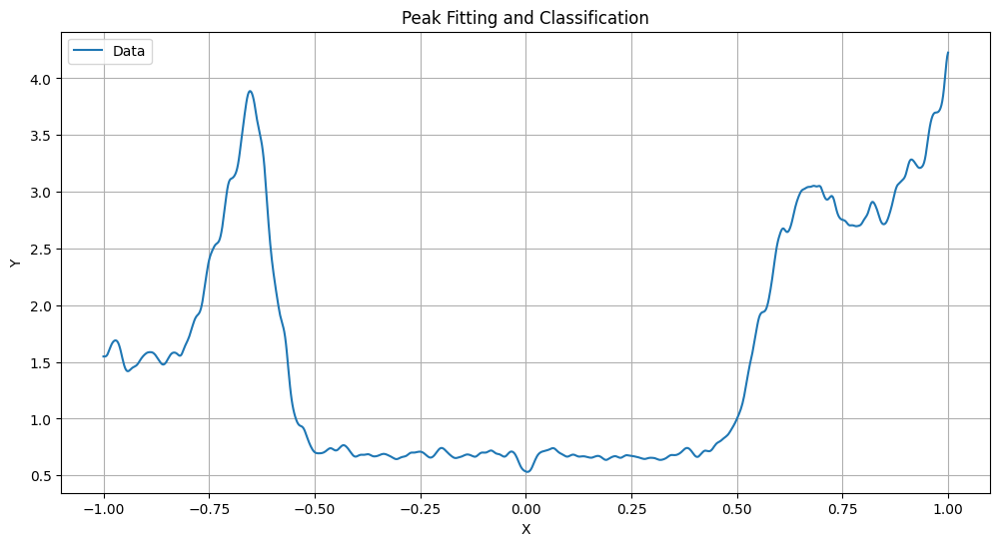

In [569]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from scipy.optimize import curve_fit

# Define Gaussian and Lorentzian functions
def gaussian(x, amplitude, center, std_dev, background):
    return background + amplitude * np.exp(-((x - center) / std_dev)**2)

def lorentzian(x, amplitude, center, width, background):
    return background + (amplitude / np.pi) * (width / ((x - center)**2 + width**2))

# Generate synthetic data with peaks
x_data = np.linspace(0, 10, 200)
gaussian_peak1 = gaussian(x_data, amplitude=1.0, center=2.5, std_dev=0.5, background=0.0)
gaussian_peak2 = gaussian(x_data, amplitude=0.8, center=7.0, std_dev=0.4, background=0.0)
lorentzian_peak1 = lorentzian(x_data, amplitude=0.6, center=4.0, width=0.3, background=0.0)
y_data = gaussian_peak1 + gaussian_peak2 + lorentzian_peak1 + 0.05 * np.random.randn(len(x_data))
y_data=gaussian_filter(grid[0:1,0,::][0]*1e12, sigma=4)
x_data=bias[::]

# Find peaks in the data
peaks, _ = find_peaks(y_data, height=3, distance=100)
print(peaks)

# Initialize lists to store peak parameters and classifications
peak_positions = []
half_widths = []
intensities = []
peak_types = []

# Loop through detected peaks and fit Gaussian and Lorentzian functions
for peak_index in peaks:
    x_peak = x_data[peak_index]
    
    # Define a window around the peak for fitting
    window_width = 50
    window_start = max(0, peak_index - window_width)
    window_end = min(len(x_data), peak_index + window_width)
    
    x_window = x_data[window_start:window_end]
    y_window = y_data[window_start:window_end]
    
    # Fit Gaussian and Lorentzian functions to the peak within the window
    try:
        params_gaussian, _ = curve_fit(gaussian, x_window, y_window, p0=[1, x_peak, 1, 0])
        params_lorentzian, _ = curve_fit(lorentzian, x_window, y_window, p0=[1, x_peak, 0.1, 0])
        
        # Calculate half-width and intensity
        half_width_gaussian = abs(params_gaussian[2] * 2)
        half_width_lorentzian = abs(params_lorentzian[2] * 2)
        intensity = params_gaussian[0]  # Assuming Gaussian peak intensity
        
        # Classify as Gaussian or Lorentzian based on width
        if half_width_gaussian < half_width_lorentzian:
            peak_types.append("Gaussian")
        else:
            peak_types.append("Lorentzian")
        
        # Append parameters and measurements to lists
        peak_positions.append(x_peak)
        half_widths.append(half_width_gaussian if half_width_gaussian < half_width_lorentzian else half_width_lorentzian)
        intensities.append(intensity)
        
    except RuntimeError:
        print("Erro")  # Skip peak if fitting fails

# Print peak information
for i in range(len(peak_positions)):
    print(f"Peak {i+1}:")
    print(f"Position: {peak_positions[i]}")
    print(f"Half-Width: {half_widths[i]}")
    print(f"Intensity: {intensities[i]}")
    print(f"Type: {peak_types[i]}")
    print("\n")

# Plot the data, fitted functions, and half-widths
plt.figure(figsize=(12, 6))
plt.plot(x_data, y_data, label='Data')
for i, peak_type in enumerate(peak_types):
    if peak_type == "Gaussian":
        plt.plot(x_data, gaussian(x_data, *params_gaussian), label='Fitted Gaussian', linestyle='--')
    else:
        plt.plot(x_data, lorentzian(x_data, *params_lorentzian), label='Fitted Lorentzian', linestyle='--')
    
# Plot vertical lines for half-widths
for x_peak, half_width in zip(peak_positions, half_widths):
    plt.axvline(x=x_peak - half_width, color='r', linestyle=':', label='Half-Width')
    plt.axvline(x=x_peak + half_width, color='r', linestyle=':')

plt.xlabel('X')
plt.ylabel('Y')
plt.title('Peak Fitting and Classification')
plt.legend()
plt.grid()
plt.show()


Peak 1:
Position: 2.613065326633166
Type: Lorentzian


Peak 2:
Position: 4.020100502512563
Type: Lorentzian


Peak 3:
Position: 7.135678391959799
Type: Lorentzian




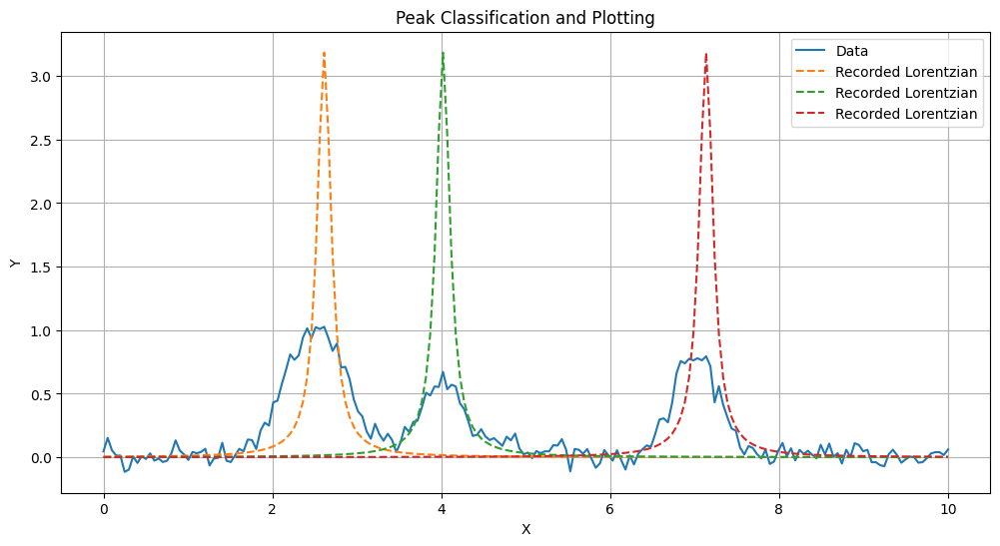

In [570]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Define Gaussian and Lorentzian functions
def gaussian(x, amplitude, center, std_dev, background):
    return background + amplitude * np.exp(-((x - center) / std_dev)**2)

def lorentzian(x, amplitude, center, width, background):
    return background + (amplitude / np.pi) * (width / ((x - center)**2 + width**2))

# Generate synthetic data with peaks
x_data = np.linspace(0, 10, 200)
gaussian_peak1 = gaussian(x_data, amplitude=1.0, center=2.5, std_dev=0.5, background=0.0)
gaussian_peak2 = gaussian(x_data, amplitude=0.8, center=7.0, std_dev=0.4, background=0.0)
lorentzian_peak1 = lorentzian(x_data, amplitude=0.6, center=4.0, width=0.3, background=0.0)
y_data = gaussian_peak1 + gaussian_peak2 + lorentzian_peak1 + 0.05 * np.random.randn(len(x_data))

# Find peaks in the data
peaks, _ = find_peaks(y_data, height=0.5, distance=10)

# Initialize lists to store peak parameters and classifications
peak_positions = []
peak_types = []

# Loop through detected peaks and classify them as Gaussian or Lorentzian based on shape
for peak_index in peaks:
    x_peak = x_data[peak_index]
    
    # Define a window around the peak for analysis
    window_width = 50
    window_start = max(0, peak_index - window_width)
    window_end = min(len(x_data), peak_index + window_width)
    
    x_window = x_data[window_start:window_end]
    y_window = y_data[window_start:window_end]
    
    # Calculate the ratio of peak height to peak width
    peak_height = max(y_window)
    peak_width = x_window[np.argmax(y_window)] - x_window[np.argmin(y_window)]
    ratio = peak_height / peak_width
    
    # Classify as Gaussian or Lorentzian based on the ratio
    if ratio > 1:
        peak_types.append("Gaussian")
    else:
        peak_types.append("Lorentzian")
    
    # Append peak position
    peak_positions.append(x_peak)

# Print peak information
for i in range(len(peak_positions)):
    print(f"Peak {i+1}:")
    print(f"Position: {peak_positions[i]}")
    print(f"Type: {peak_types[i]}")
    print("\n")

# Plot the data, recorded Gaussian, and recorded Lorentzian peaks
plt.figure(figsize=(12, 6))
plt.plot(x_data, y_data, label='Data')

for i, peak_type in enumerate(peak_types):
    if peak_type == "Gaussian":
        plt.plot(x_data, gaussian(x_data, 1, peak_positions[i], 0.1, 0), label='Recorded Gaussian', linestyle='--')
    else:
        plt.plot(x_data, lorentzian(x_data, 1, peak_positions[i], 0.1, 0), label='Recorded Lorentzian', linestyle='--')

plt.xlabel('X')
plt.ylabel('Y')
plt.title('Peak Classification and Plotting')
plt.legend()
plt.grid()
plt.show()


[155]
Peak 1:
Position: 0.6969696879386902
Type: Gaussian
Half-Width: 48.47518734191419


r_squared_gaussian1 0.9916391158476472
r_squared_gaussian1 0.8830747604370117
[162]
Peak 1:
Position: 0.6832844614982605
Type: Gaussian
Half-Width: 53.63577943721418


r_squared_gaussian1 0.972820807248354
r_squared_gaussian1 0.9581623859703541
[180]
Peak 1:
Position: 0.6480938196182251
Type: Gaussian
Half-Width: 29.778282906485117


r_squared_gaussian1 0.9772871267050505
r_squared_gaussian1 0.9626868665218353
[]
r_squared_gaussian1 0.9750285875052214
[]
r_squared_gaussian1 0.990363304503262
[]
r_squared_gaussian1 0.9917195457965136
[178]
Peak 1:
Position: 0.6520038843154907
Type: Gaussian
Half-Width: 42.108448058967554


r_squared_gaussian1 0.9918264588341117
r_squared_gaussian1 0.9459740109741688
[]
r_squared_gaussian1 0.9744776096194983
[]
r_squared_gaussian1 0.9877340449020267
[]
r_squared_gaussian1 0.9904755894094706
[]
r_squared_gaussian1 0.9869274199008942
[]
r_squared_gaussian1 0.975750470

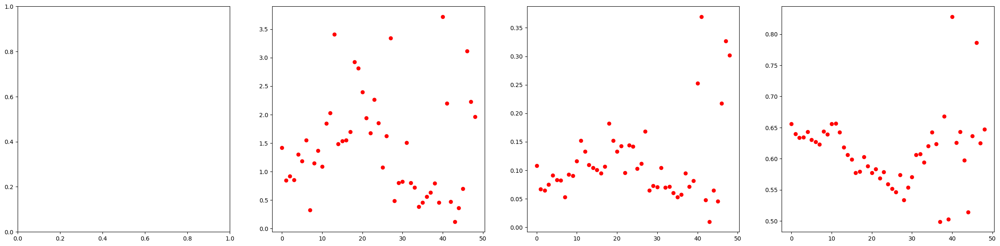

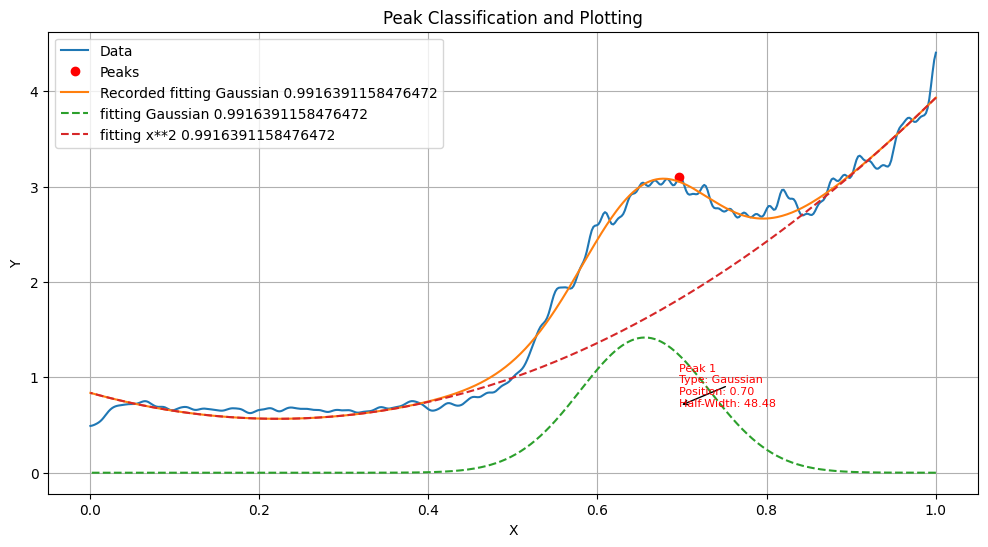

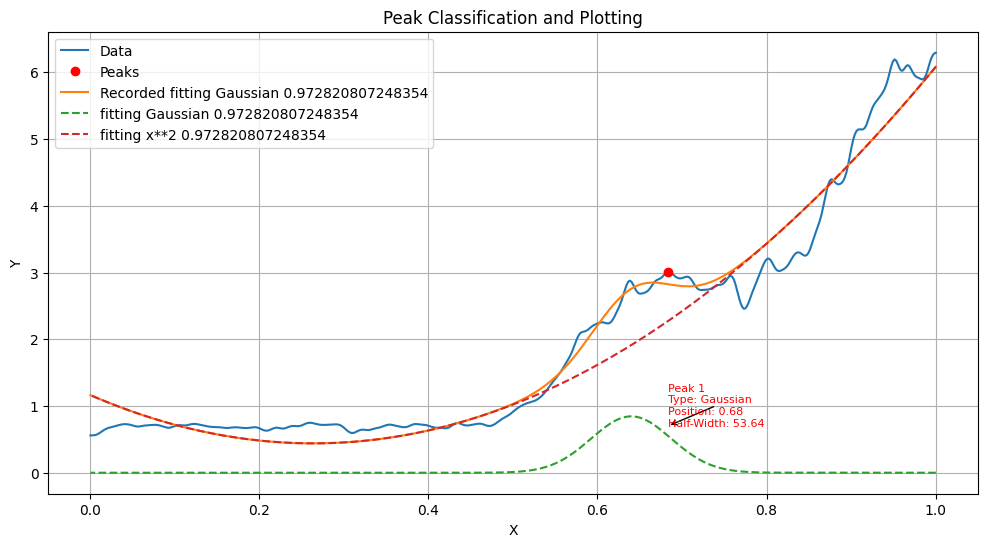

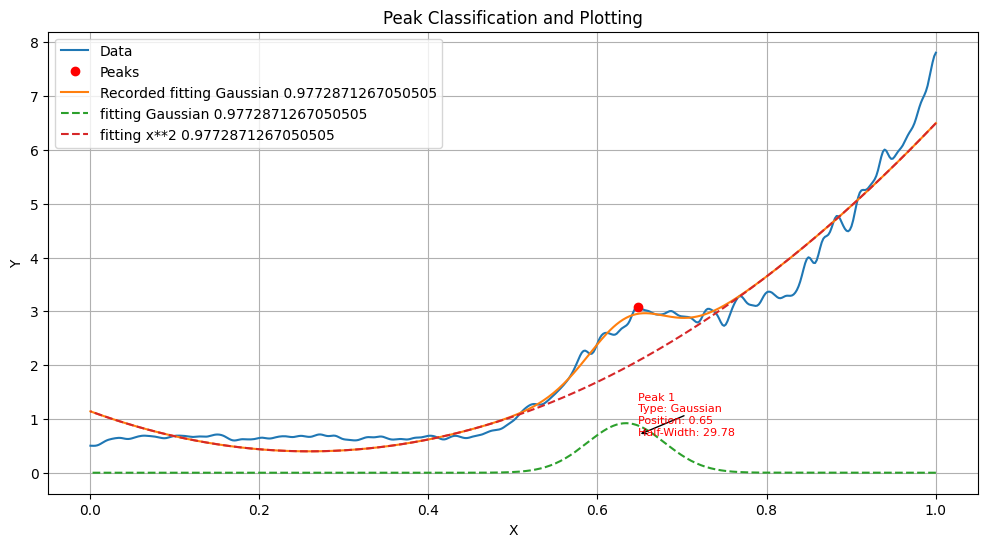

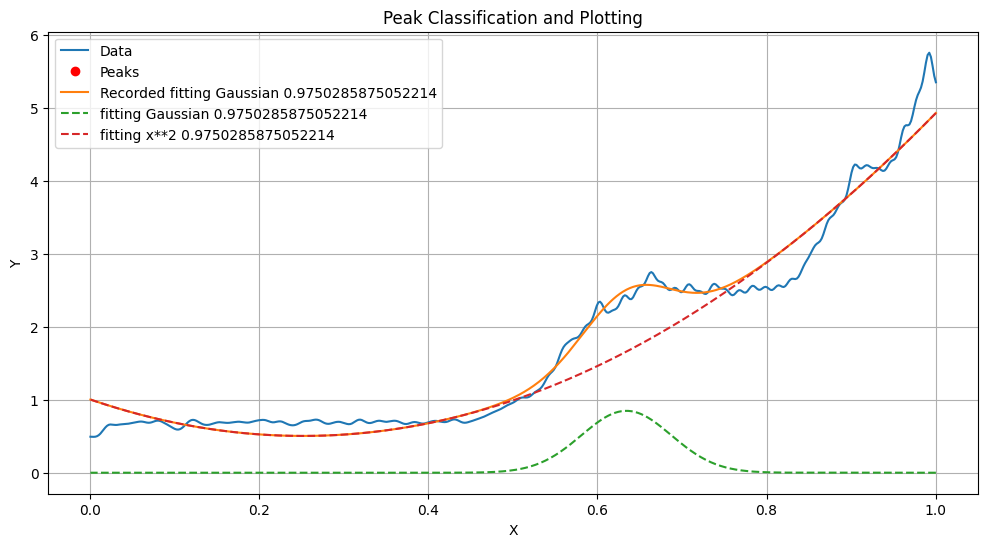

...

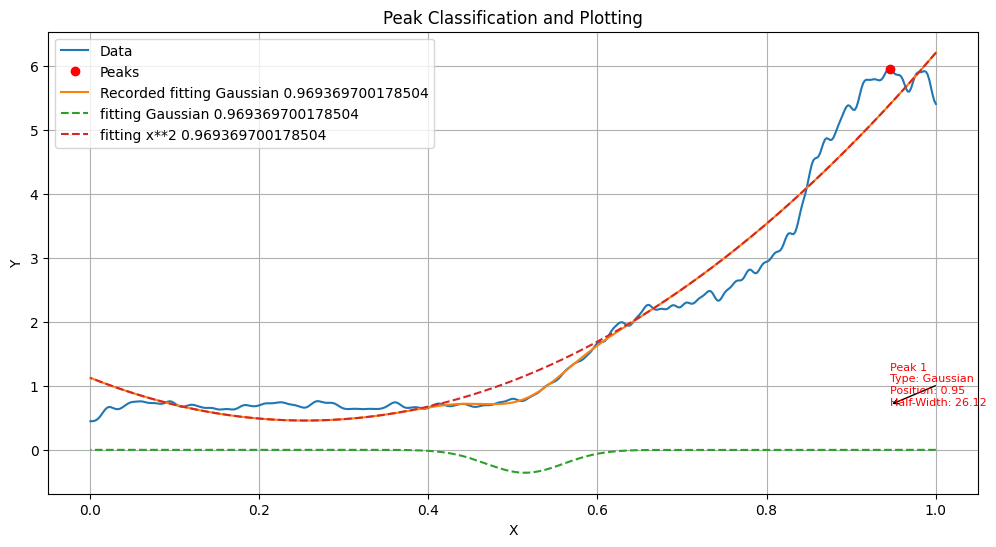

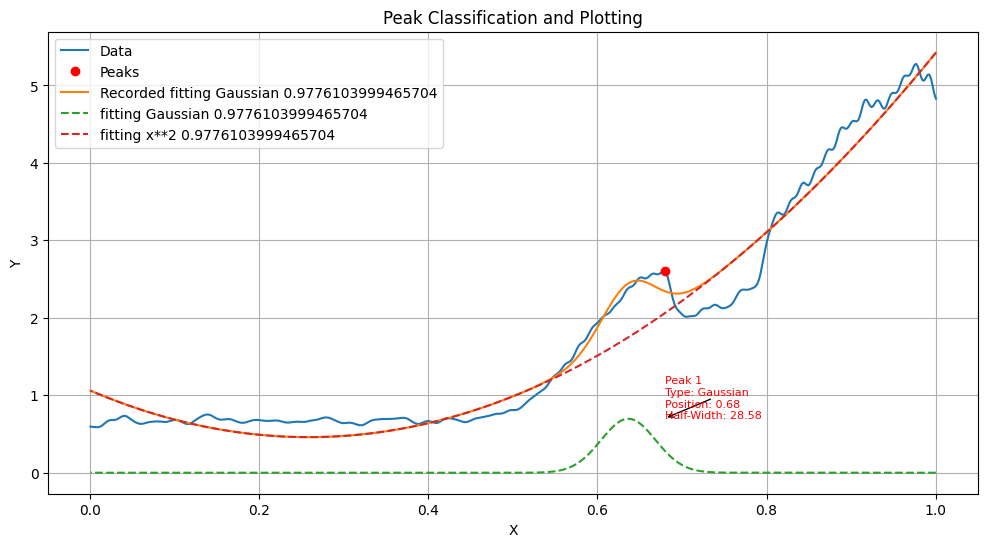

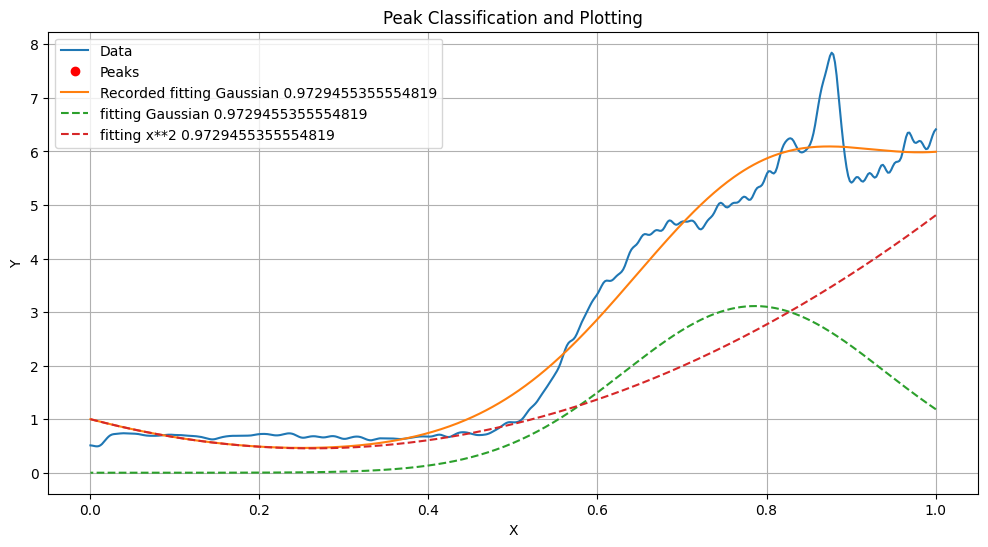

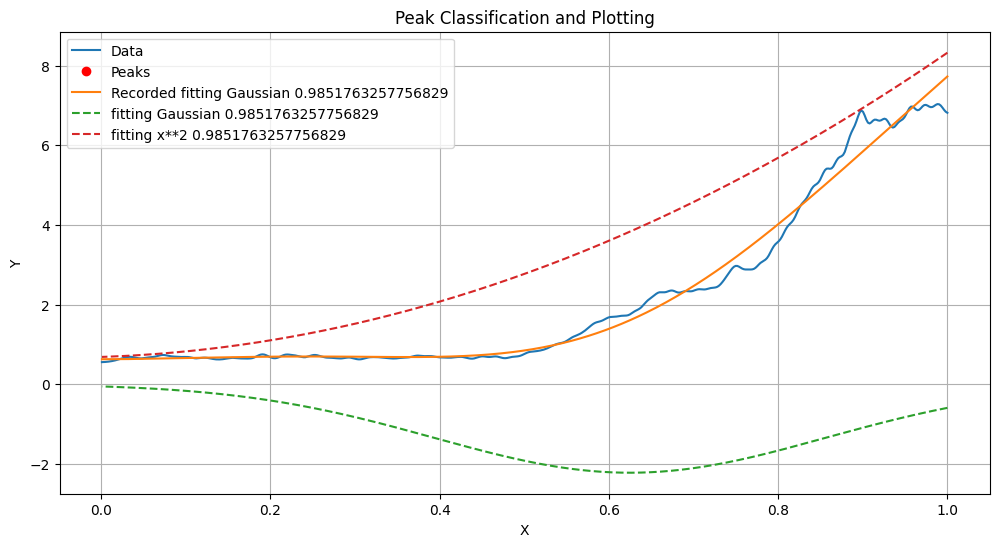

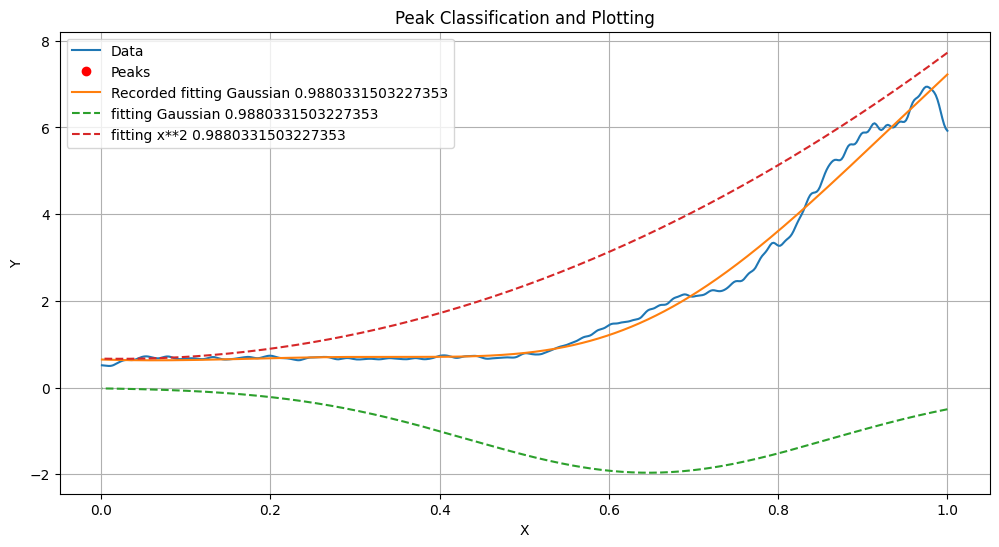

In [702]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks, peak_widths

fig,ax=plt.subplots(1,4,figsize=(30,7))
peak_positionsA=[]
half_widA=[]
fittingA=[]
fittingB=[]
# Define Gaussian and Lorentzian functions
def gaussian(x, amplitude, center, std_dev, a,b,background):
    return background +a*x+b*x**2 +amplitude * np.exp(-((x - center) / std_dev)**2)

def lorentzian(x, amplitude, center, width, background):
    return background + (amplitude / np.pi) * (width / ((x - center)**2 + width**2))
count=0
# Generate synthetic data with peaks
for i in range(grid.shape[0]-1):
    #count=[i for i in range(grid.shape[0]-1)]
    count+=count
    y_data=gaussian_filter(grid[i:1+i,0,:512:][0]*1e12, sigma=3)
    x_data=bias[:512:]

    # Find peaks in the data
    peaks, _ = find_peaks(y_data, height=[1,7], distance=15,width=25)
    print(peaks)



    # Calculate the half-width of the peaks
    half_widths, _, _, _ = peak_widths(y_data, peaks, rel_height=0.5)

    # Initialize lists to store peak parameters and classifications
    peak_positions = []
    peak_types = []
    def annotate_peak_info(ax, peak_positions, peak_types, half_widths):
        for i in range(len(peak_positions)):
            info = f"Peak {i + 1}\nType: {peak_types[i]}\nPosition: {peak_positions[i]:.2f}\nHalf-Width: {half_widths[i]:.2f}"
            ax.annotate(info, xy=(peak_positions[i], 0.7), xycoords='data', textcoords='data',
                        arrowprops=dict(arrowstyle="->"), fontsize=8, color='red')

    # Loop through detected peaks and classify them as Gaussian or Lorentzian based on shape
    for i, peak_index in enumerate(peaks):
        x_peak = x_data[peak_index]
        half_width = half_widths[i]

        # Classify as Gaussian or Lorentzian based on the half-width
        if half_width > 1:
            peak_types.append("Gaussian")
        else:
            peak_types.append("Lorentzian")

        # Append peak parameters
        peak_positions.append(x_peak)
    #peak_positionsA.append(peak_positions)
    #half_widA.append(half_width)


   

        

        




    # Print peak information
    for i in range(len(peak_positions)):
        print(f"Peak {i + 1}:")
        print(f"Position: {peak_positions[i]}")
        print(f"Type: {peak_types[i]}")
        print(f"Half-Width: {half_widths[i]}")
        print("\n")
    

    # Plot the data, recorded Gaussian, and recorded Lorentzian peaks
    plt.figure(figsize=(12, 6))
    plt.plot(x_data, y_data, label='Data')
    plt.plot(x_data[peaks], y_data[peaks], 'ro', label='Peaks')

    params_gaussian, _ = curve_fit(gaussian, x_data, y_data, p0=[2, 0.58, 0.02, 0,10,  0])
    half_width_gaussian = params_gaussian[2] * 2
    
    



    half_widths_gaussian.append(half_width_gaussian)
    #print("fitting",params_gaussian,half_widths_gaussian)
    ssr_gaussian1 = np.sum((y_data - gaussian(x_data,*params_gaussian))**2)
    rmse_gaussian1 = np.sqrt(ssr_gaussian1 / len(x_data))
    r_squared_gaussian1 = 1 - (ssr_gaussian1 / np.sum((y_data - np.mean(y_data))**2))
    print("r_squared_gaussian1",r_squared_gaussian1)
    plt.plot(x_data, gaussian(x_data,*params_gaussian), label='Recorded fitting Gaussian {0}'.format(r_squared_gaussian1), linestyle='-')
    plt.plot(x_data, gaussian(x_data,params_gaussian[0],params_gaussian[1],params_gaussian[2],0,0,0), label='fitting Gaussian {0}'.format(r_squared_gaussian1), linestyle='--')
    plt.plot(x_data, gaussian(x_data,0,params_gaussian[1],params_gaussian[2],params_gaussian[3],params_gaussian[4],params_gaussian[5]), label='fitting x**2 {0}'.format(r_squared_gaussian1), linestyle='--')
    fittingA.append(params_gaussian[1])
    fittingB.append(params_gaussian[2])
    peak_positionsA.append(params_gaussian[0])

    for i, peak_type in enumerate(peak_types):
        if peak_type == "Gaussian":
            params_gaussian, _ = curve_fit(gaussian, x_data, y_data, p0=[y_data[peaks][i], -0.7, half_widths[i]*2/1024,-2.46964389,  5.56226159,  0.83952221])
            half_width_gaussian = params_gaussian[2] * 2
            
           
        
        
        
            half_widths_gaussian.append(half_width_gaussian)
            #print("fitting",params_gaussian,half_widths_gaussian)
            ssr_gaussian1 = np.sum((y_data - gaussian(x_data,*params_gaussian))**2)
            rmse_gaussian1 = np.sqrt(ssr_gaussian1 / len(x_data))
            r_squared_gaussian1 = 1 - (ssr_gaussian1 / np.sum((y_data - np.mean(y_data))**2))
            print("r_squared_gaussian1",r_squared_gaussian1)
           # plt.plot(x_data, gaussian(x_data, y_data[peaks][i], peak_positions[i], half_widths[i]*2/1024, 0,0,0), label='Recorded Gaussian', linestyle='--')
           # plt.plot(x_data, gaussian(x_data,*params_gaussian), label='Recorded fitting Gaussian {0}'.format(r_squared_gaussian1), linestyle='-')
        else:
            plt.plot(x_data, lorentzian(x_data, 3, peak_positions[i], half_widths[i]*2/1024, 0), label='Recorded Lorentzian', linestyle='--')
    annotate_peak_info(plt.gca(), peak_positions, peak_types, half_widths)
    
    
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.title('Peak Classification and Plotting')
    plt.legend()
    plt.grid()

##ax[0].plot(half_widA, 'ro', label='Peaks')
ax[1].plot(abs(np.array(peak_positionsA)), 'ro', label='Peaks')
ax[2].plot(abs(np.array(fittingB)), 'ro', label='Peaks')
ax[3].plot(fittingA, 'ro', label='Peaks')
plt.show()


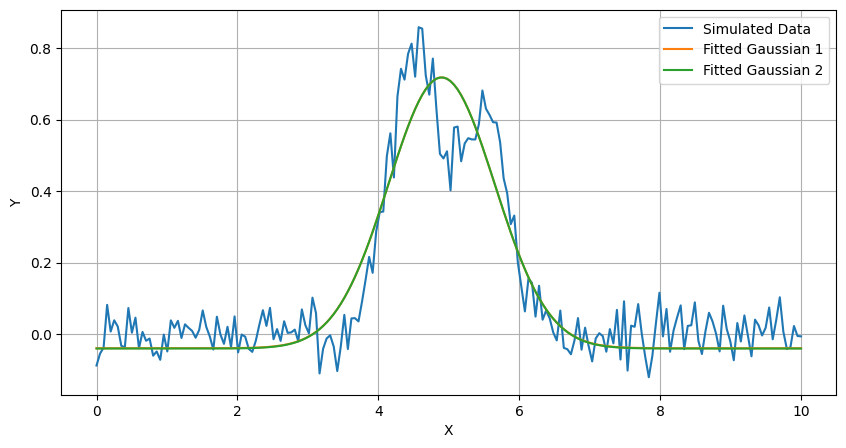

In [458]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Define the Gaussian peak function
def gaussian(x, amplitude, center, std_dev, background):
    return background + amplitude * np.exp(-((x - center) / std_dev)**2)

# Generate synthetic data with overlapping Gaussian peaks and noise
x_data = np.linspace(0, 10, 200)
y_data = (
    gaussian(x_data, 0.8, 4.5, 0.5, 0) +  # First Gaussian peak
    gaussian(x_data, 0.6, 5.5, 0.5, 0) +  # Second Gaussian peak (overlapping)
    0.05 * np.random.randn(len(x_data))  # Noise
)

# Define the number of peaks (adjust as needed)
num_peaks = 2

# Create a function to fit the two Gaussian peaks
def fit_peaks(x, y, peak_func):
    max_index1 = np.argmax(y)
    max_index2 = np.argmax(y[max_index1+1:]) + max_index1 + 1  # Find the second peak maximum index
    peak_center1 = x[max_index1]
    peak_center2 = x[max_index2]
    
    window_width = 50
    peak_start1 = max(0, max_index1 - window_width)
    peak_end1 = min(len(x), max_index1 + window_width)
    peak_start2 = max(0, max_index2 - window_width)
    peak_end2 = min(len(x), max_index2 + window_width)
    
    x_window1 = x[peak_start1:peak_end1]
    y_window1 = y[peak_start1:peak_end1]
    x_window2 = x[peak_start2:peak_end2]
    y_window2 = y[peak_start2:peak_end2]
    
    initial_guess1 = [max(y_window1), peak_center1, 1.0, 0]
    initial_guess2 = [max(y_window2), peak_center2, 1.0, 0]
    
    params1, _ = curve_fit(peak_func, x_window1, y_window1, p0=initial_guess1)
    params2, _ = curve_fit(peak_func, x_window2, y_window2, p0=initial_guess2)
    
    return np.concatenate((params1, params2))

# Fit the two overlapping Gaussian peaks
params = fit_peaks(x_data, y_data, gaussian)

# Plot the original data and the fitted Gaussian peaks
plt.figure(figsize=(10, 5))
plt.plot(x_data, y_data, label='Simulated Data')

for i in range(num_peaks):
    plt.plot(x_data, gaussian(x_data, *params[i*4:i*4+4]), label=f'Fitted Gaussian {i+1}')

plt.xlabel('X')
plt.ylabel('Y')
plt.legend()
plt.grid()
plt.show()


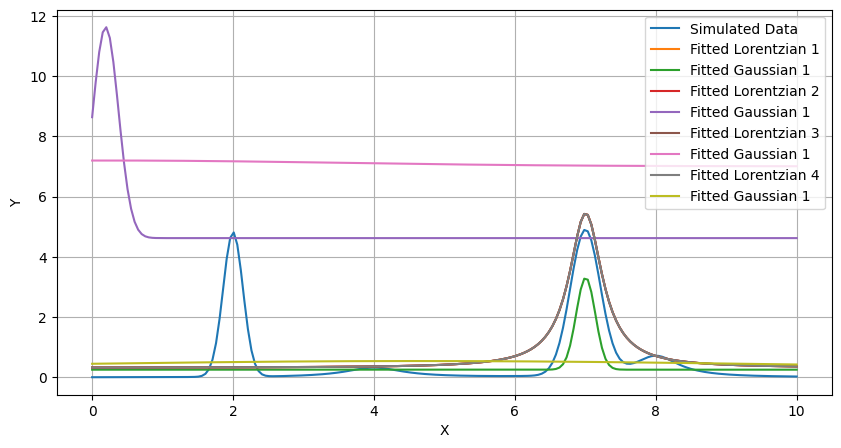

In [461]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler


# Define the Lorentzian, Gaussian, linear, quadratic, cubic, and exponential functions
def lorentzian(x, amplitude, center, width, d=0):
    return d + (amplitude / np.pi) * (width / ((x - center)**2 + width**2))

def gauss(x, amplitude, center, std_dev, d=0):
    return d + amplitude * np.exp(-((x - center) / std_dev)**2)

def linear(x, a, b, c=0, d=0):
    return a * x + b + c + d

def quadratic(x, a, b, c, d=0):
    return a * x**2 + b * x + c + d

def cubic(x, a, b, c, d=0):
    return a * x**3 + b * x**2 + c * x + d

def exponential(x, a, b, c=0, d=0):
    return a * np.exp(-b * x) + c + d




# Simulated data with peaks (replace with your data)
x_data = np.linspace(0, 10, 200)
y_data = (
    0.5 * lorentzian(x_data, 1, 4, 0.5, 0) +        # First Lorentzian peak
    0.8 * gauss(x_data, 6, 7, 0.3, 0) +            # First Gaussian peak
    0.3 * lorentzian(x_data, 3, 8, 0.4, 0) +        # Second Lorentzian peak
    0.6 * gauss(x_data, 8, 2, 0.2, 0)               # Second Gaussian peak
)

#x_data,y_data=bias[512::],grid[0:1,0,512::][0]

# Define the number of peaks
num_peaks = 4  # Adjust the number of peaks as needed

# Create a function to fit each peak
def fit_peak(x, y, peak_func):
    # Find approximate peak location
    max_index = np.argmax(y)
    peak_center = x[max_index]
    
    # Define a window around the peak
    window_width = 500  # Adjust the width as needed
    peak_start = max(0, max_index - window_width)
    peak_end = min(len(x), max_index + window_width)
    
    # Extract data within the window
    x_window = x[peak_start:peak_end]
    y_window = y[peak_start:peak_end]
    
    # Initial guess for peak parameters
    initial_guess = [max(y_window), peak_center, 1.0, 0]  # Provide default value 0 for 'd'
    
    # Fit the peak using curve_fit
    params, _ = curve_fit(peak_func, x_window, y_window, p0=initial_guess)
    
    return params

# Create an empty list to store peak parameters
peak_parameters = []



# Fit each peak using the corresponding function
for _ in range(num_peaks):
    # Fit Lorentzian
    params = fit_peak(x_data, y_data, lorentzian)
    peak_parameters.extend(params)
    
    # Fit Gaussian
    params = fit_peak(x_data, y_data, gauss)
    peak_parameters.extend(params)

# Fit additional functions
for func in [ gauss,lorentzian]:#linear, quadratic, cubic, exponential,
    params = fit_peak(x_data, y_data, func)
    peak_parameters.extend(params)  # Extend with all parameters

# Convert the list of peak parameters to a list of arrays
peak_parameters = [np.array(params) for params in peak_parameters]


plt.figure(figsize=(10, 5))
plt.plot(x_data, y_data, label='Simulated Data')
for i in range(num_peaks):
    
    plt.plot(x_data, lorentzian(x_data, *peak_parameters[i*8+4:i*8+8]), label=f'Fitted Lorentzian {i+1}')
    plt.plot(x_data, gauss(x_data, *peak_parameters[i:i+4]), label=f'Fitted Gaussian {i//4+1}')

    
    

plt.xlabel('X')
plt.ylabel('Y')
plt.legend()
plt.grid()
plt.show()



# Create a StandardScaler instance
scaler = StandardScaler()

cubic,lorentzian, gauss

X = np.column_stack(
                    [lorentzian(x_data, *peak_parameters[i:i+4]) for i in range(4, num_peaks*8, 8)] +
                    [gauss(x_data, *peak_parameters[i:i+4]) for i in range(num_peaks*8, num_peaks*8+4)] 
                    )
# Scale the feature matrix X
X_scaled = scaler.fit_transform(X)

# Fit the peaks and functions in the simulated data using Lasso regression
alpha = 0.01  # Lasso regularization parameter, adjust as needed
lasso_peak_fitting_model = Lasso(alpha=alpha, positive=True, max_iter=10000)
lasso_peak_fitting_model.fit(X, y_data)

# Predict peak parameters for the entire x_data range
predicted_peak_parameters = lasso_peak_fitting_model.predict(X)

# Plot the original data and the fitted peaks with their respective parameters





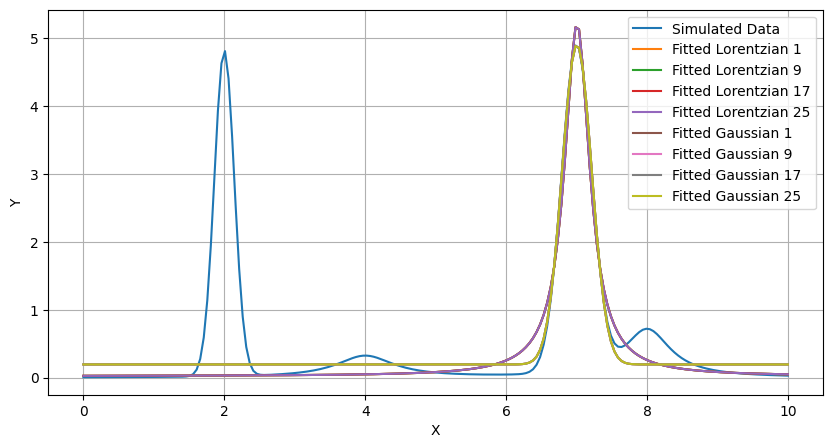

In [429]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler

# Define the Lorentzian and Gaussian functions
def lorentzian(x, amplitude, center, width, background):
    return background + (amplitude / np.pi) * (width / ((x - center)**2 + width**2))

def gauss(x, amplitude, center, std_dev, background):
    return background + amplitude * np.exp(-((x - center) / std_dev)**2)

# Generate synthetic data with noise
x_data = np.linspace(0, 10, 200)
y_data = (
    0.5 * lorentzian(x_data, 1, 4, 0.5, 0) +
    0.8 * gauss(x_data, 6, 7, 0.3, 0) +
    0.3 * lorentzian(x_data, 3, 8, 0.4, 0) +
    0.6 * gauss(x_data, 8, 2, 0.2, 0)
)

# Define the number of peaks
num_peaks = 4

# Create a function to fit each peak
def fit_peak(x, y, peak_func):
    max_index = np.argmax(y)
    peak_center = x[max_index]
    window_width = 50
    peak_start = max(0, max_index - window_width)
    peak_end = min(len(x), max_index + window_width)
    x_window = x[peak_start:peak_end]
    y_window = y[peak_start:peak_end]
    initial_guess = [max(y_window), peak_center, 1.0, 0]
    params, _ = curve_fit(peak_func, x_window, y_window, p0=initial_guess)
    return params

# Create an empty list to store peak parameters
peak_parameters = []

# Fit each peak using the corresponding function
for _ in range(num_peaks):
    params = fit_peak(x_data, y_data, lorentzian)
    peak_parameters.extend(params)
    params = fit_peak(x_data, y_data, gauss)
    peak_parameters.extend(params)

# Convert the list of peak parameters to a list of arrays
peak_parameters = [np.array(params) for params in peak_parameters]

# Create feature vectors for peak fitting (Lorentzian and Gaussian)
X = np.column_stack(
    [lorentzian(x_data, *peak_parameters[i:i+4]) for i in range(0, num_peaks*8, 8)] +
    [gauss(x_data, *peak_parameters[i:i+4]) for i in range(4, num_peaks*8,8)]
)

# Create a StandardScaler instance and scale the feature matrix X
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit the peaks and functions in the simulated data using Lasso regression
alpha = 0.01  # Lasso regularization parameter, adjust as needed
lasso_peak_fitting_model = Lasso(alpha=alpha, positive=True, max_iter=10000)
lasso_peak_fitting_model.fit(X_scaled, y_data)

# Predict peak parameters for the entire x_data range
predicted_peak_parameters = lasso_peak_fitting_model.predict(X_scaled)

# Plot the original data and the fitted peaks with their respective parameters
plt.figure(figsize=(10, 5))
plt.plot(x_data, y_data, label='Simulated Data')

# Plot the fitted Lorentzian peaks
for i in range(0, num_peaks*8, 8):
    plt.plot(x_data, lorentzian(x_data, *peak_parameters[i:i+4]) , label=f'Fitted Lorentzian {i+1}')

# Plot the fitted Gaussian peaks
for i in range(4, num_peaks*8,8):
    plt.plot(x_data, gauss(x_data, *peak_parameters[i:i+4]), label=f'Fitted Gaussian {i-num_peaks+1}')

plt.xlabel('X')
plt.ylabel('Y')
plt.legend()
plt.grid()
plt.show()


[4.226651, 1.0, 0.2, 0]
[4.226651, 1.0, 0.2, 0]
[0.38192383 1.04815611 0.04739395 2.93364758 0.38192383 1.04815611
 0.04739395 2.93364758]


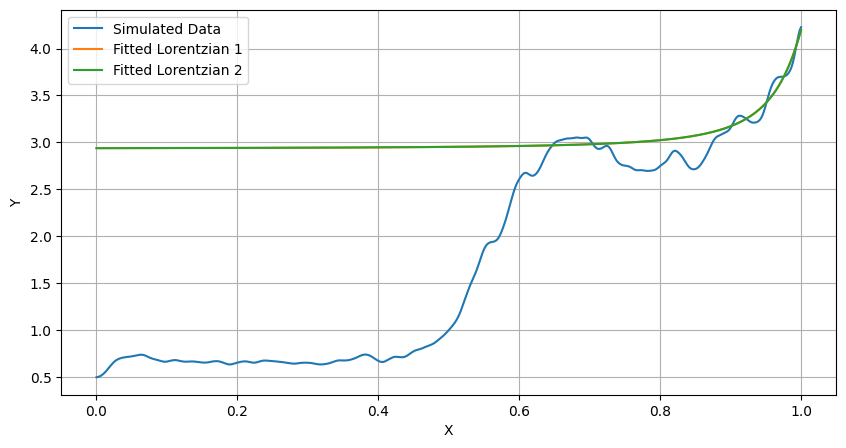

In [547]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler

# Define the Lorentzian function
def lorentzian(x, amplitude1, center1, width1, background):
    return background + (amplitude1 / np.pi) * (width1 / ((x - center1)**2 + width1**2)) 

# Generate synthetic data with overlapping Lorentzian peaks and noise
x_data = np.linspace(0, 10, 200)
y_data = (
    lorentzian(x_data, 0.8, 4.5, 0.5, 0) +  # Overlapping Lorentzian peaks
    0.05 * np.random.randn(len(x_data))  # Noise
)

# Define the number of peaks (in this case, 2 Lorentzian peaks)
num_peaks = 2

y_data=gaussian_filter(grid[0:1,0,:512:][0]*1e12, sigma=4)
x_data=bias[:512:]

# Create a function to fit each peak
def fit_peak(x, y, peak_func):
    max_index = np.argmax(y)
    peak_center = x[max_index]
    window_width = 50
    peak_start = max(0, max_index - window_width)
    peak_end = min(len(x), max_index + window_width)
    x_window = x[peak_start:peak_end]
    y_window = y[peak_start:peak_end]
    initial_guess = [max(y_window), peak_center, 0.2, 0]
    print(initial_guess)
    params, _ = curve_fit(peak_func, x_window, y_window, p0=initial_guess)
    return params

# Create an empty list to store peak parameters
peak_parameters = []

# Fit each peak using the Lorentzian function
for _ in range(num_peaks):
    params = fit_peak(x_data, y_data, lorentzian)
    peak_parameters.extend(params)

# Convert the list of peak parameters to a list of arrays
peak_parameters = [np.array(params) for params in peak_parameters]
print(np.array(peak_parameters))

plt.figure(figsize=(10, 5))
plt.plot(x_data, y_data, label='Simulated Data')

for i in range(num_peaks):
    plt.plot(x_data, lorentzian(x_data, *peak_parameters[i*4:i*4+4]), label=f'Fitted Lorentzian {i+1}')

plt.xlabel('X')
plt.ylabel('Y')
plt.legend()
plt.grid()
plt.show()





In [548]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler

# Define the Lorentzian function
def lorentzian_3d(x, amplitude1, center1, width1, amplitude2, center2, width2, amplitude3, center3, width3, background):
    return background + \
           (amplitude1 / np.pi) * (width1 / ((x - center1)**2 + width1**2)) + \
           (amplitude2 / np.pi) * (width2 / ((x - center2)**2 + width2**2)) + \
           (amplitude3 / np.pi) * (width3 / ((x - center3)**2 + width3**2))

# Generate synthetic data with overlapping Lorentzian peaks and noise
x_data = np.linspace(0, 10, 200)
y_data = (
    lorentzian_3d(x_data, 0.8, 4.5, 0.5, 0.6, 5.5, 0.5, 0.7, 7.5, 0.4, 0) +  # Overlapping Lorentzian peaks
    0.05 * np.random.randn(len(x_data))  # Noise
)
x_data,y_data=bias[::],grid[0:1,0,::][0]
# Define the number of peaks (1, 2, or 3 Lorentzian peaks)





num_peaks = 3

# Create a function to fit each peak
def fit_peak(x, y, peak_func, num_params):
    max_index = np.argmax(y)
    peak_center = x[max_index]
    window_width = 100
    peak_start = max(0, max_index - window_width)
    peak_end = min(len(x), max_index + window_width)
    x_window = x[peak_start:peak_end]
    y_window = y[peak_start:peak_end]
    initial_guess = [max(y_window), peak_center, 1.0] * num_params + [0]
    params, _ = curve_fit(peak_func, x_window, y_window, p0=initial_guess)
    return params

# Create an empty list to store peak parameters
peak_parameters = []

# Fit each peak using the Lorentzian function
for _ in range(num_peaks):
    params = fit_peak(x_data, y_data, lorentzian_3d, num_params=3)
    peak_parameters.extend(params)

# Convert the list of peak parameters to a list of arrays
peak_parameters = [np.array(params) for params in peak_parameters]


plt.figure(figsize=(10, 5))
plt.plot(x_data, y_data, label='Simulated Data')

for i in range(num_peaks):
    plt.plot(x_data, lorentzian_3d(x_data, *peak_parameters[i*10:i*10+10]), label=f'Fitted Lorentzian {i+1}')

plt.xlabel('X')
plt.ylabel('Y')
plt.legend()
plt.grid()
plt.show()

# Create feature vectors for peak fitting (Lorentzian)
X = np.column_stack(
    [lorentzian_3d(x_data, *peak_parameters[i:i+10]) for i in range(0, num_peaks*10, 10)]
)

# Create a StandardScaler instance and scale the feature matrix X
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit the peaks in the simulated data using Lasso regression
alpha = 0.01  # Lasso regularization parameter, adjust as needed
lasso_peak_fitting_model = Lasso(alpha=alpha, positive=True, max_iter=10000)
lasso_peak_fitting_model.fit(X_scaled, y_data)

# Predict peak parameters for the entire x_data range
predicted_peak_parameters = lasso_peak_fitting_model.predict(X_scaled)

# Plot the original data and the fitted overlapping Lorentzian peaks
plt.figure(figsize=(10, 5))
plt.plot(x_data, y_data, label='Simulated Data')

for i in range(num_peaks):
    plt.plot(x_data, lorentzian_3d(x_data, *predicted_peak_parameters[i*10:i*10+10]), label=f'Fitted Lorentzian {i+1}')

plt.xlabel('X')
plt.ylabel('Y')
plt.legend()
plt.grid()
plt.show()


RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 2200.

In [ ]:
raw_filted=gaussian_filter(raw_data, sigma=3)

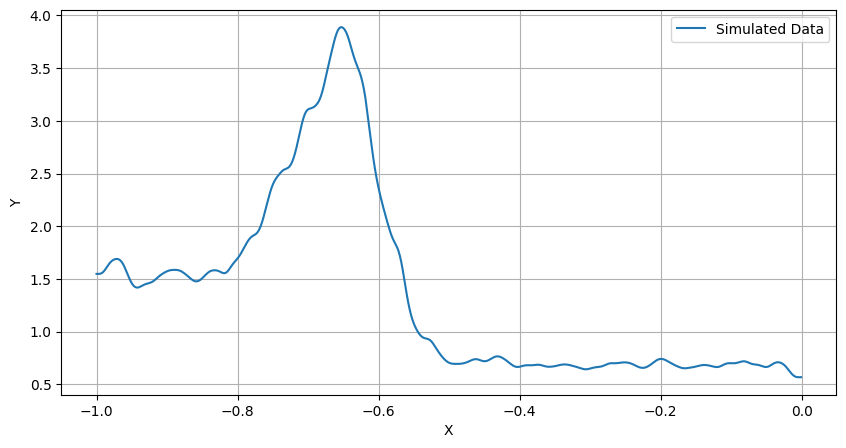

RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 8000.

In [437]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler

# Define the composite function
def composite_function(x, *params):
    num_peaks = len(params) // 8
    result = np.zeros_like(x)
    
    for i in range(num_peaks):
        # Lorentzian peak
        amplitude_l = params[i * 8]
        center_l = params[i * 8 + 1]
        width_l = params[i * 8 + 2]
        lorentzian_peak = (amplitude_l / np.pi) * (width_l / ((x - center_l) ** 2 + width_l ** 2))
        
        # Gaussian peak
        amplitude_g = params[i * 8 + 3]
        center_g = params[i * 8 + 4]
        std_dev_g = params[i * 8 + 5]
        gaussian_peak = amplitude_g * np.exp(-((x - center_g) / std_dev_g) ** 2)
        
        # Cubic background
        cubic_params = params[i * 8 + 6:i * 8 + 10]
        cubic_background = np.polyval(cubic_params, x)
        
        # Combine Lorentzian, Gaussian, and cubic background
        result += lorentzian_peak + gaussian_peak +cubic_background
    
    return result

# Generate synthetic data with overlapping peaks and noise
x_data = np.linspace(0, 10, 200)
y_data = (
    composite_function(x_data, 0.8, 4.5, 0.5, 0.6, 5.5, 0.5, 0.7, 7.5, 0.4, 0) +  # Overlapping peaks
    0.05 * np.random.randn(len(x_data))  # Noise
)
y_data=gaussian_filter(grid[0:1,0,512::][0]*1e12, sigma=4)
x_data=bias[512::]

# Define the number of peaks (adjust as needed)
num_peaks = 3


plt.figure(figsize=(10, 5))
plt.plot(x_data, y_data, label='Simulated Data')
#plt.plot(x_data, composite_function(x_data, *peak_parameters), label='Fitted Composite Function', linestyle='--')

plt.xlabel('X')
plt.ylabel('Y')
plt.legend()
plt.grid()
plt.show()

# Create a function to fit the composite function
def fit_composite(x, y, composite_func, num_params):
    max_index = np.argmax(y)
    peak_center = x[max_index]
    window_width = 100
    peak_start = max(0, max_index - window_width)
    peak_end = min(len(x), max_index + window_width)
    x_window = x[peak_start:peak_end]
    y_window = y[peak_start:peak_end]
    initial_guess = [max(y_window), peak_center, 1.0] * (3 * num_peaks) + [0] * (4 * num_peaks)
    params, _ = curve_fit(composite_func, x_window, y_window, p0=initial_guess)
    return params

# Create an empty list to store peak parameters
peak_parameters = []

# Fit the composite function
params = fit_composite(x_data, y_data, composite_function, num_params=num_peaks)
peak_parameters.extend(params)

# Convert the list of peak parameters to an array
peak_parameters = np.array(peak_parameters)

# Plot the original data and the fitted composite function
plt.figure(figsize=(10, 5))
plt.plot(x_data, y_data, label='Simulated Data')
plt.plot(x_data, composite_function(x_data, *peak_parameters), label='Fitted Composite Function', linestyle='--')

plt.xlabel('X')
plt.ylabel('Y')
plt.legend()
plt.grid()
plt.show()

# Create feature vectors for peak fitting (composite function)
X = np.column_stack([composite_function(x_data, *peak_parameters)])

# Create a StandardScaler instance and scale the feature matrix X
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit the peaks in the simulated data using Lasso regression
alpha = 0.01  # Lasso regularization parameter, adjust as needed
lasso_peak_fitting_model = Lasso(alpha=alpha, positive=True, max_iter=10000)
lasso_peak_fitting_model.fit(X_scaled, y_data)

# Predict peak parameters for the entire x_data range
predicted_peak_parameters = lasso_peak_fitting_model.predict(X_scaled)

# Plot the original data and the fitted composite function
plt.figure(figsize=(10, 5))
plt.plot(x_data, y_data, label='Simulated Data')
plt.plot(x_data, composite_function(x_data, *predicted_peak_parameters), label='Fitted Composite Function', linestyle='--')

plt.xlabel('X')
plt.ylabel('Y')
plt.legend()
plt.grid()
plt.show()


In [378]:
data=[lorentzian(x_data, *peak_parameters[i:i+4]) for i in range(0, num_peaks*8, 8)]
gaus=[gauss(x_data, *peak_parameters[i:i+4]) for i in range(4, num_peaks*8,8)]

TypeError: lorentzian() missing 3 required positional arguments: 'center2', 'width2', and 'background'

In [314]:
np.array(data).shape

(2, 200)

In [315]:
np.array(peak_parameters).shape

(16,)

In [316]:
for i in range(0, num_peaks*8, 8):
    print(i)

0
8


In [317]:
for i in range(4, num_peaks*8,8):
    print(i)

4
12


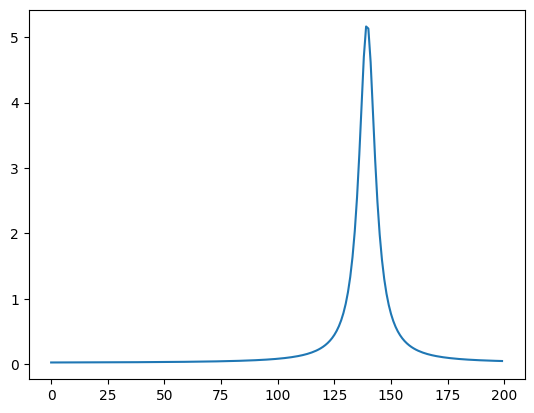

In [318]:
plt.plot(data[1])

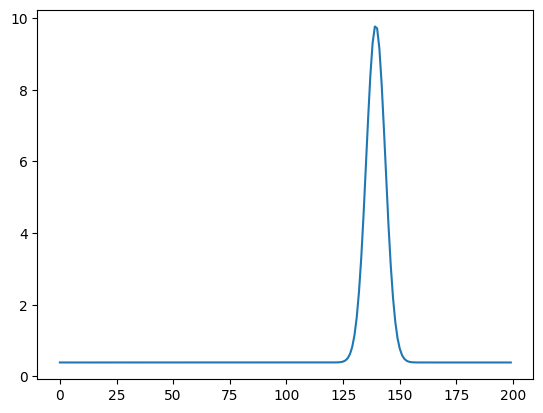

In [319]:
plt.plot(gaus[1]+gaus[0])

[[0.20377629 0.20377629 0.02231006 4.71134898 7.22260345 0.31179378]
 [0.20390771 0.20390771 0.02231006 4.71134898 7.22260068 0.31193065]
 [0.204042   0.204042   0.02231006 4.71134898 7.22254845 0.31206735]
 ...
 [0.24741891 0.24741891 0.02231006 4.71134898 7.0079037  0.31049227]
 [0.24565284 0.24565284 0.02231006 4.71134898 7.00778611 0.31035537]
 [0.24397376 0.24397376 0.02231006 4.71134898 7.00767312 0.31021862]]


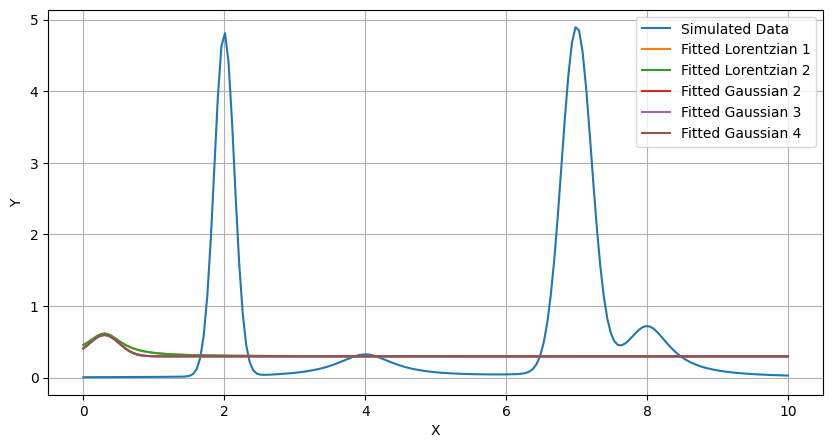

In [160]:
from sklearn.preprocessing import StandardScaler

# Create a StandardScaler instance
scaler = StandardScaler()



X = np.column_stack(
                    [lorentzian(x_data, *peak_parameters[i:i+4]) for i in range(4, num_peaks*8, 8)] +
                    [gauss(x_data, *peak_parameters[i:i+4]) for i in range(num_peaks*8, num_peaks*8+4)] 
                    )
# Scale the feature matrix X
print(X)
X_scaled = scaler.fit_transform(X)

# Fit the peaks and functions in the simulated data using Lasso regression
alpha = 0.01  # Lasso regularization parameter, adjust as needed
lasso_peak_fitting_model = Lasso(alpha=alpha, positive=True, max_iter=10000)
lasso_peak_fitting_model.fit(X, y_data)

# Predict peak parameters for the entire x_data range
predicted_peak_parameters = lasso_peak_fitting_model.predict(X)

# Plot the original data and the fitted peaks with their respective parameters
plt.figure(figsize=(10, 5))
plt.plot(x_data, y_data, label='Simulated Data')
for i in range(num_peaks):
    
    plt.plot(x_data, lorentzian(x_data, *predicted_peak_parameters[i*8+4:i*8+8]), label=f'Fitted Lorentzian {i+1}')
for i in range(num_peaks * 2, num_peaks * 8, 4):
    plt.plot(x_data, gauss(x_data, *predicted_peak_parameters[i:i+4]), label=f'Fitted Gaussian {i//4+1}')
    

plt.xlabel('X')
plt.ylabel('Y')
plt.legend()
plt.grid()
plt.show()

7.007068743009968 0.21738646831839337 0.022310060610343383 4.71134898463018


In [27]:
from scipy.optimize import curve_fit

In [42]:
def _2Lorentzian(x,amp1,cen1,wid1,amp2,cen2,wid2):
    return (amp1*wid1**2/((x-cen1)**2+wid1**2))+(amp2*wid2**2/((x-cen2)**2+wid1**2))

In [29]:
grid[0:1,0,::].shape

(1, 1024)

In [38]:
para,cov=curve_fit(_2Lorentzian,bias[512::],grid[0:1,0,512::][0])

In [47]:
Y=_2Lorentzian(bias[512::],para[0],para[1],para[2],para[3],para[4],para[5])

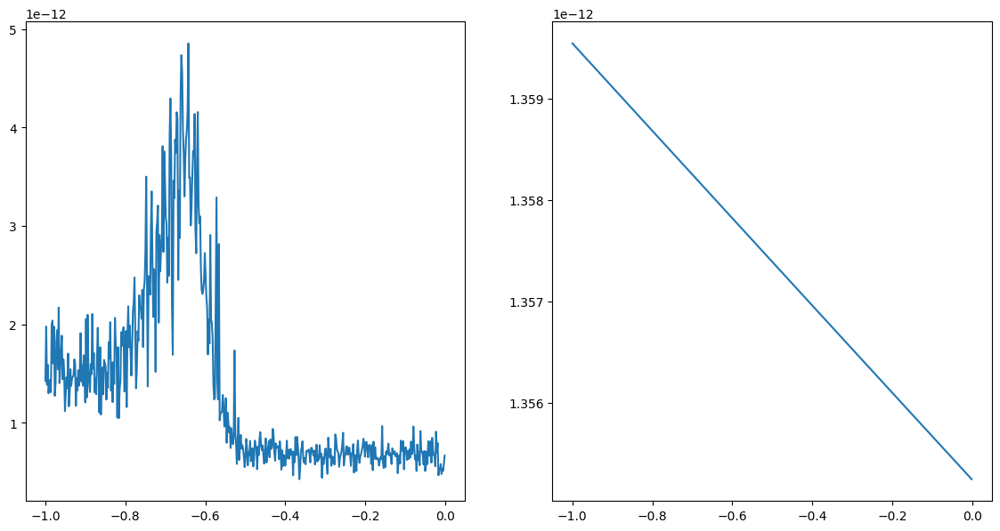

In [49]:
fig,ax=plt.subplots(1,2,figsize=(14,7))
ax[0].plot(bias[512::],grid[0:1,0,512::][0])
ax[1].plot(bias[512::],Y)

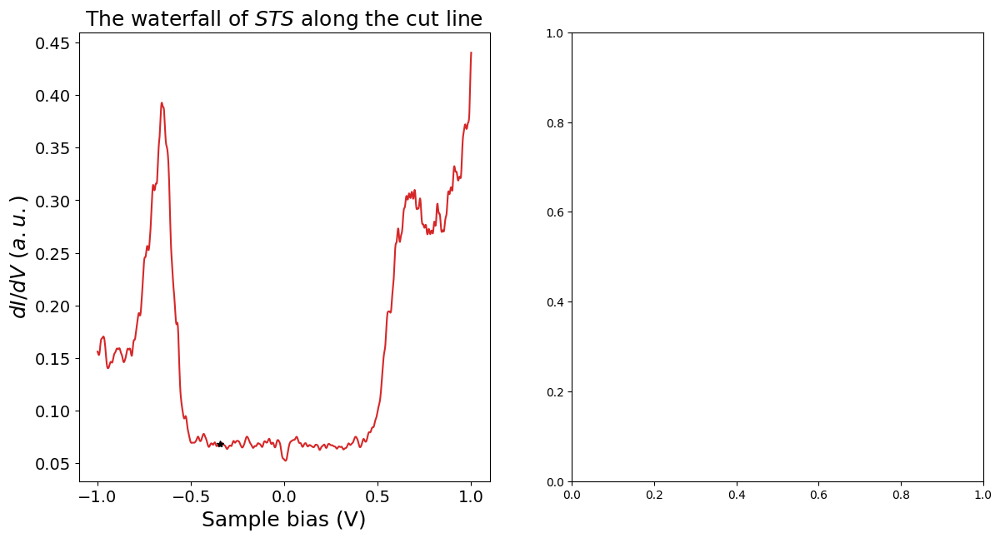

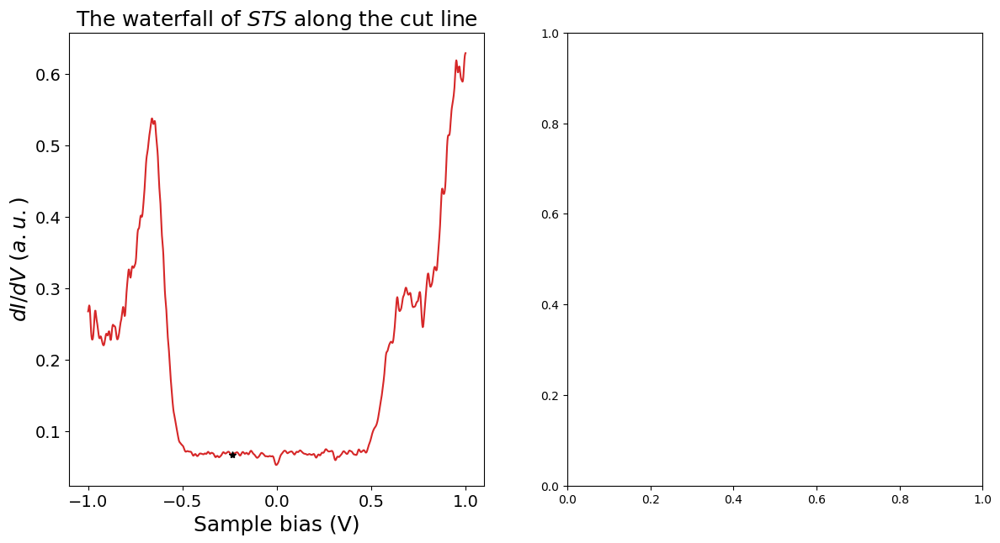

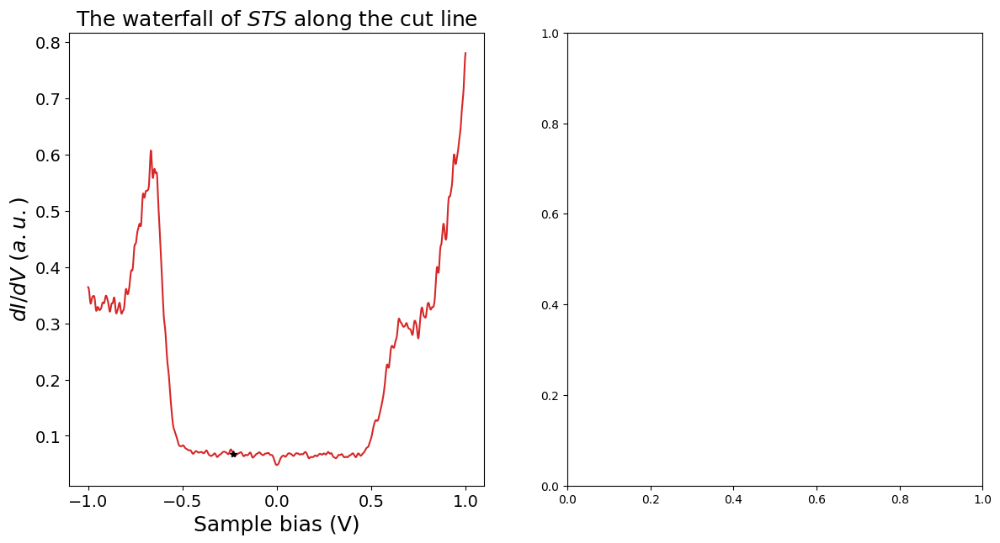

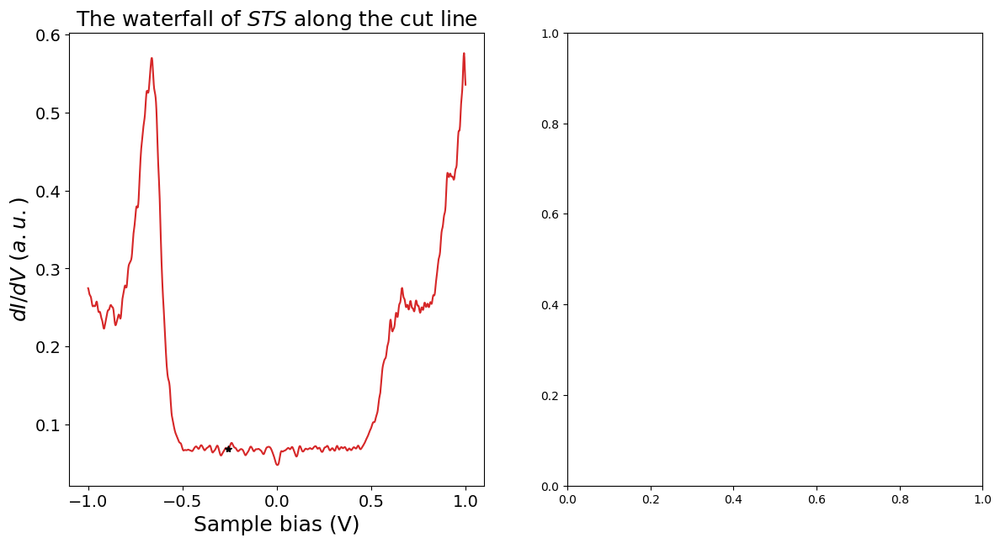

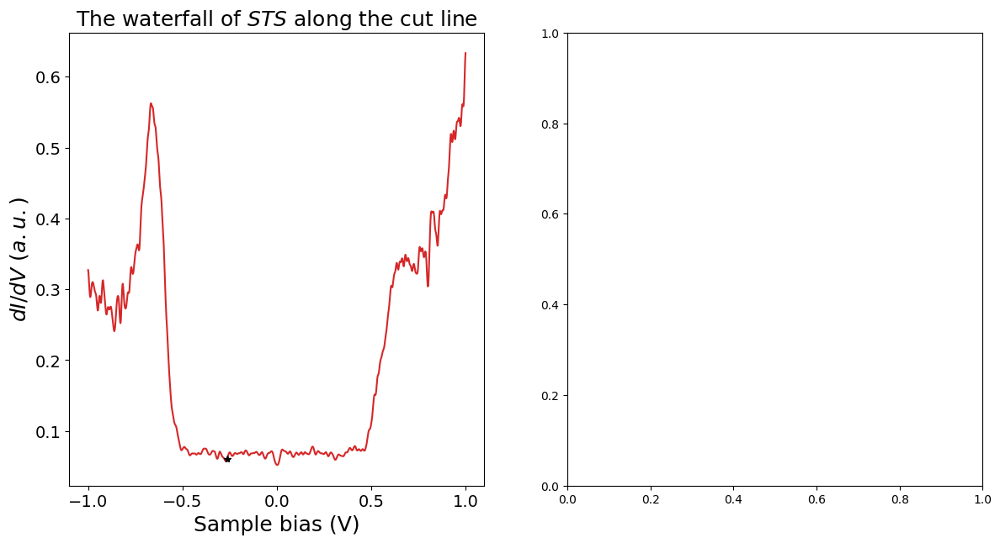

...

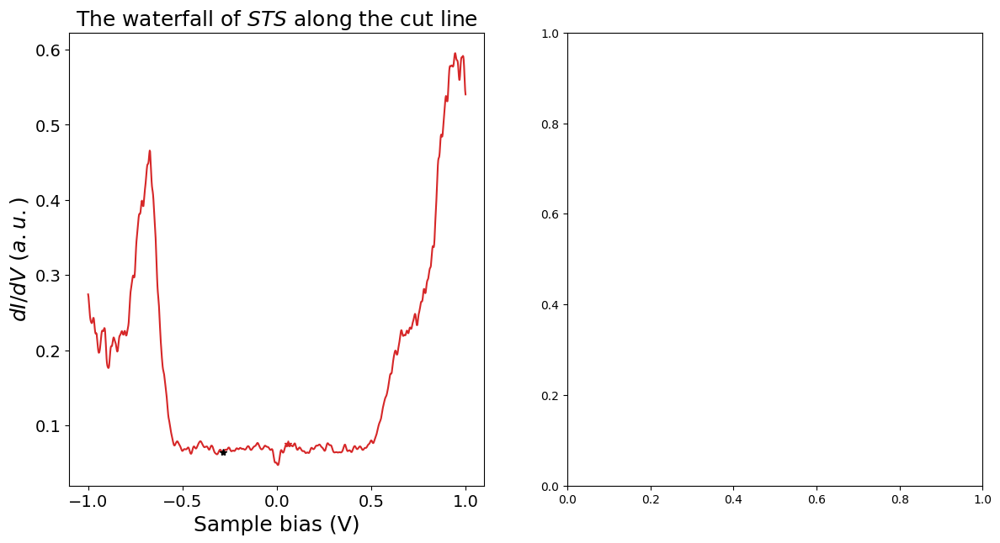

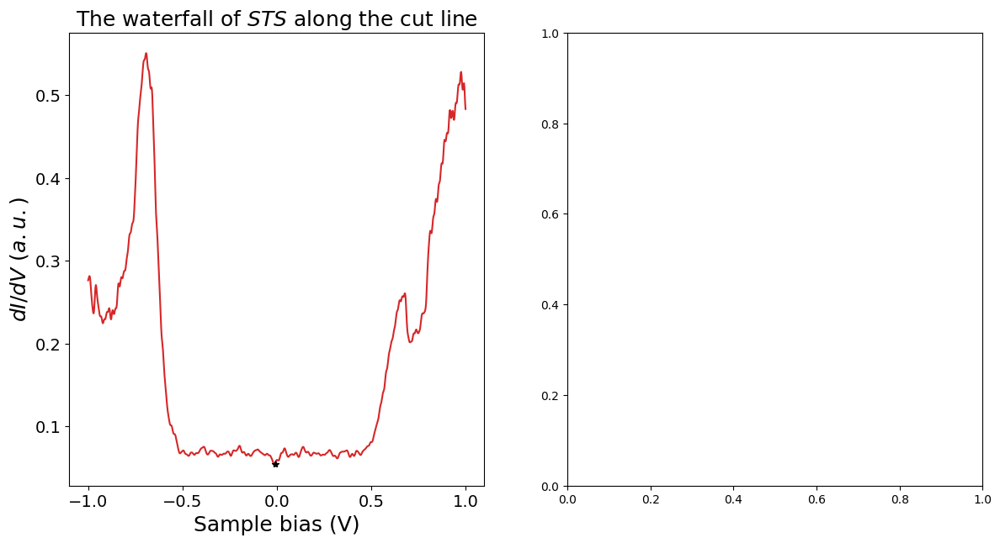

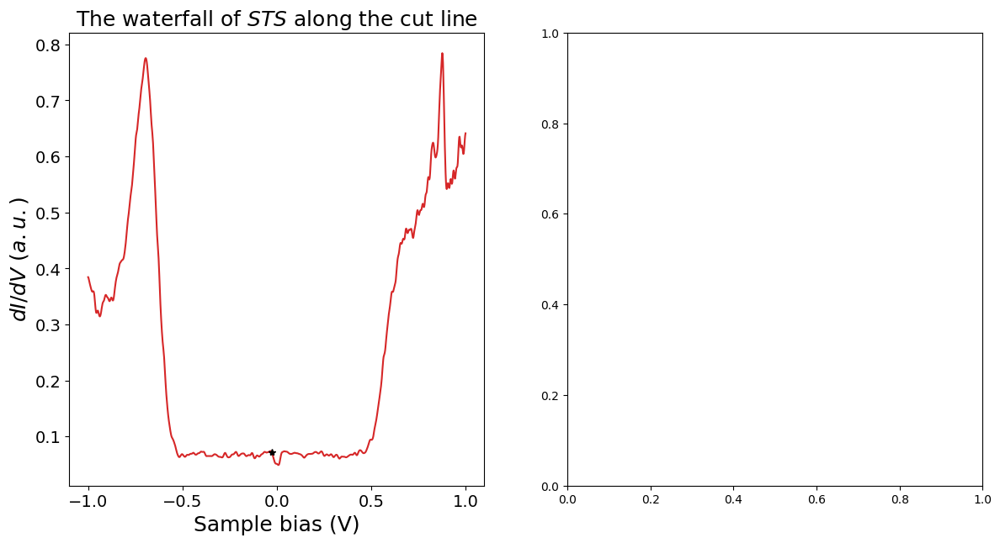

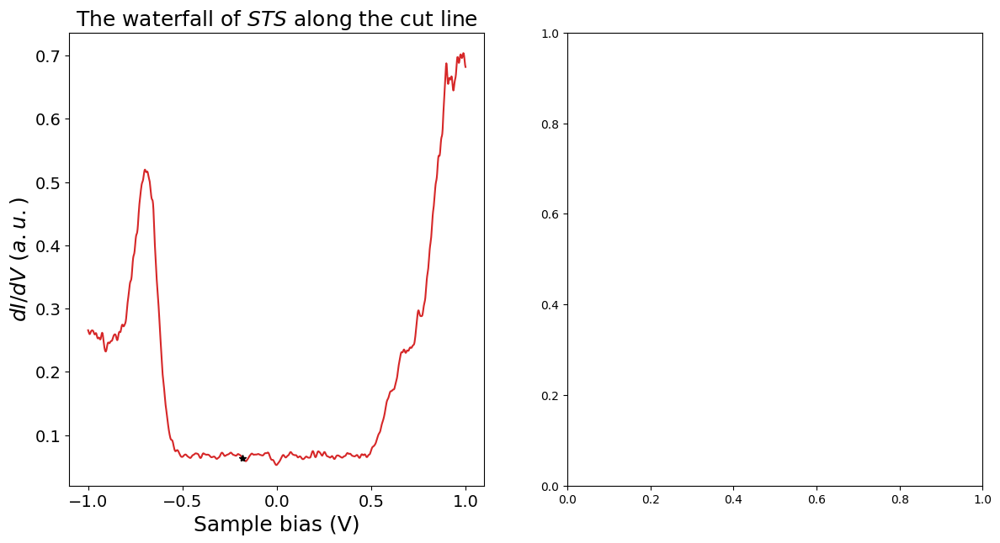

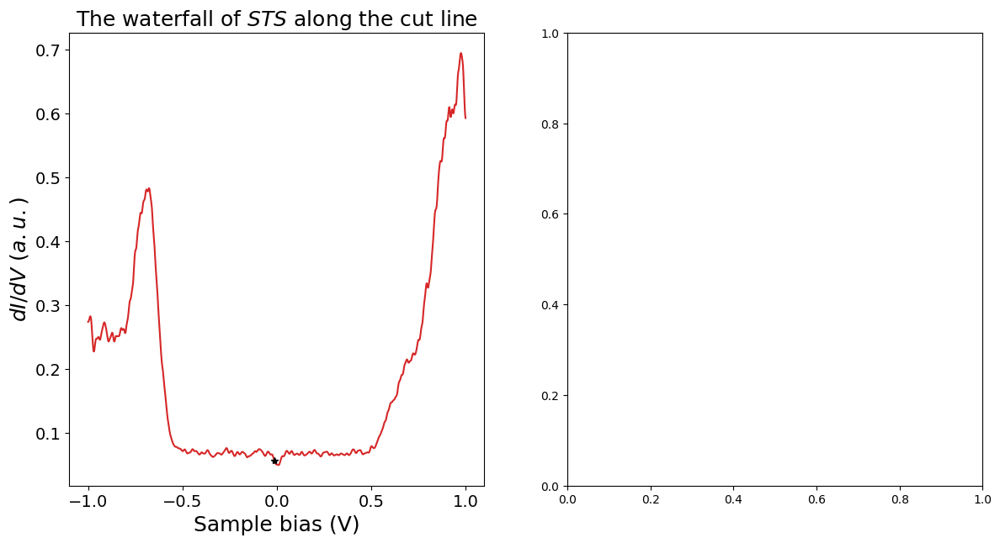

In [69]:

for i in range(grid.shape[0]-1):
    fig,ax=plt.subplots(1,2,figsize=(14,7))
    plot_STS_line_spectrum(bias,grid[i:i+1,0,::],ax[0])
    plot_peak_spectrum(bias,grid[i:i+1,0,::],ax[0])